<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/5/51/RMIT_University_Logo.svg/2560px-RMIT_University_Logo.svg.png' alt='RMIT' style='width:30%; border:0;padding:2em' align='left'>
<span>
    <h1 style="color:#000000;font-size:20px;font-family:helvetica;line-height:1.5;padding:1em">
    RMIT University Vietnam<br>
    School of Science, Engineering, and Technology (SSET)<br>
    COSC2753 - Machine Learning - 2023A
    </h1>
</span>

<h1 style='color:#4472C4;font-size:60px;font-family:helvetica;text-align:center;'>
    <strong>
Classify Images of Flowers
    </strong>
</h1>


<h3 style='color:#4472C4;font-size:30px;font-family:helvetica;text-align:center;'>
Author: Nguyen Dang Huynh Chau
</h3>

<div style=”page-break-after: always;”></div>

<h2 style='color:#4472C4;font-size:45px;font-family:helvetica;text-align:center;'>
    <strong>
    Table of Content
    </strong>
</h2>

### [I. Introduction](#I)
[1.1. Problem Statement](#1.1)

[1.2. Setup](#1.2)

[1.3. Data Information](#1.3)

[1.4. Data Loading](#1.4)


<br>

### [II. Exploratory Data Analysis](#II)
[2.1. Duplicated data](#2.1)

[2.2. Imbalanced samples](#2.2)

[2.3 Inconsistency resolution](#2.3)

[2.4. Unwanted features](#2.4)

[2.5. Collage Images](#2.5)

<br>

### [III. Data Cleaning and Feature Engineering](#III)
[3.1. Increase samples (rotate, flip and split multiview image)](#3.1)

[3.2 Resize images into unified resolution](#3.2)

[3.3. Remove unwanted features](#3.3)

[3.4. Centralise target object](#3.4)

[3.5. Split dataset](#3.5)
<br>

### [IV. Model Building](#IV)


<br>

### [V. Final Verdict](#V)

[5.1. Chosen Model](#5.1)

[5.2. Prediction & Export Result](#5.2)

<br>

### [VI. References](#VI)

<a id='I'></a>
<h2 style='color:#4472C4;font-size:45px;font-family:helvetica;text-align:center;'>
    <strong>
    I. Introduction
    </strong>
</h2>

<a id='1.1'></a>
### **1.1.** Problem Statement
***

In the world of e-commerce business, user experience is a top-most priority factor that contributes to the success of the enterprise among competitors. In order to improve user experience as well as the quality of searching result, a given e-commerce flower shop has came up with the idea of allowing customers upload flower's image and providing list of similar items, replacing the traditional method of searching the flower name manually.

In a nutshell, the tasks for a team are given as follows:
* **Task 1**: Classify images according to flower type (Baby, Calimero, Chrysanthemum, Hydrangeas, Lisianthus, Pingpong, Rosy and Tana).

* **Task 2**: Recommend 10 flower images in the dataset which is similar to the input flower image from users.

<a id='1.2'></a>
### **1.2.** Setup
***

In [22]:
# Uncomment the below line of code to install all the required package (if not already) 
# !pip install -r requirements.txt

In [147]:
# Import necessary libraries
import pandas as pd # For dataframe
import numpy as np
import matplotlib.pyplot as plt # For plotting
import seaborn as sns # For plotting
import os, pathlib
import re # For regular expression
import cv2
from collections import defaultdict
import hashlib
from collections import Counter
import random
import shutil
import math

# Import Keras associated libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

# Import imbalance learn
from imblearn.over_sampling import RandomOverSampler
from imblearn.tensorflow import balanced_batch_generator

# Import Python image library
import PIL
import PIL.Image

# Import scikit-learn pre-processing
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

# Import sci-kit learn pipeline
from sklearn.pipeline import Pipeline

# Import sci-kit learn classification models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Import sci-kit learn validation metrics
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import roc_auc_score, RocCurveDisplay
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.tree import plot_tree # For plotting decision trees

# # For cross-validation
from sklearn.model_selection import StratifiedKFold, cross_val_score

# Import Optuna for hyper-parameter tuning
import optuna


# Import datetime for system time
from datetime import datetime

# Import pickle to save models
import pickle

# Initial Setup
%matplotlib inline 

plt.rcParams["figure.figsize"] = 10, 5 # Set default figure size

sns.set_theme(style='whitegrid', palette='bright') # Set theme for Seaborn plots

rand_seed = 42 # seed for randomization

In [27]:
!python --version

Python 3.9.16


<a id='1.3'></a>
### **1.3.** Data information
***

The dataset is a hierarchical structure, 1 root directory contains 8 sub-directories corresponding to each flower class.

```
└───data/
│    └───Flowers/
│    │   └───Babi/
│    │   └───Calimerio/
│    │   └───Chrysanthemum/
│    │   └───Hydrangeas/
│    │   └───Lisianthus/
│    │   └───Pingpong/
│    │   └───Rosy/
│    │   └───Tana/
```

In [28]:
rootDataPath = pathlib.Path('./data/Flowers/')

In [29]:
flowerClass = os.listdir(rootDataPath)
try :
 flowerClass.remove('.DS_Store') 
except :
 print('No DS_Store')
print(flowerClass, '\n', len(flowerClass))

['Babi', 'Pingpong', 'Chrysanthemum', 'Rosy', 'Tana', 'Hydrangeas', 'Lisianthus', 'Calimerio'] 

 8


In [30]:
#Go through the sub-directories and list the numbers of files
for dirpath, dirnames, filenames in os.walk(rootDataPath):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")

There are 8 directories and 1 images in data/Flowers

There are 0 directories and 931 images in data/Flowers/Babi

There are 0 directories and 360 images in data/Flowers/Pingpong

There are 0 directories and 696 images in data/Flowers/Chrysanthemum

There are 0 directories and 171 images in data/Flowers/Rosy

There are 0 directories and 623 images in data/Flowers/Tana

There are 0 directories and 518 images in data/Flowers/Hydrangeas

There are 0 directories and 969 images in data/Flowers/Lisianthus

There are 0 directories and 353 images in data/Flowers/Calimerio


<a id='1.4'></a>
### **1.4.** Data Loading
***

In [31]:
# Load the dataset into list 
raw_babi = list(rootDataPath.glob('Babi/*'))
raw_calimerio = list(rootDataPath.glob('Calimerio/*'))
raw_chrysanthemum = list(rootDataPath.glob('Chrysanthemum/*'))
raw_rosy = list(rootDataPath.glob('Rosy/*'))
raw_tana = list(rootDataPath.glob('Tana/*'))
raw_pingpong = list(rootDataPath.glob('Pingpong/*'))
raw_hydrangeas = list(rootDataPath.glob('Hydrangeas/*'))
raw_lisianthus = list(rootDataPath.glob('Lisianthus/*'))

The imported data are stored in variables under List objects, but as these are unordered lists, they must be arranged in ascending order.

Taking *Babi* class as an example.

In [32]:
print('Before sorting: ')
for i, img_no in enumerate(raw_babi[0:5]):
    print(f"Image {i+1}: {img_no}")

Before sorting: 

Image 1: data/Flowers/Babi/babi_926.jpg

Image 2: data/Flowers/Babi/babi_729.jpg

Image 3: data/Flowers/Babi/babi_701.jpg

Image 4: data/Flowers/Babi/babi_715.jpg

Image 5: data/Flowers/Babi/babi_259.jpg


In [33]:
# Create empty lists for storing sorted paths
babi = [str(path) for path in raw_babi]
calimerio = [str(path) for path in raw_calimerio]
chrysanthemum = [str(path) for path in raw_chrysanthemum]
rosy = [str(path) for path in raw_rosy]
tana = [str(path) for path in raw_tana]
pingpong = [str(path) for path in raw_pingpong]
hydrangeas = [str(path) for path in raw_hydrangeas]
lisianthus = [str(path) for path in raw_lisianthus]

In [34]:
# Sort the imported image paths in natural sort order 
babi.sort(key= lambda f: int(re.sub('\D', '', f)))
calimerio.sort(key= lambda f: int(re.sub('\D', '', f)))
chrysanthemum.sort(key= lambda f: int(re.sub('\D', '', f)))
rosy.sort(key= lambda f: int(re.sub('\D', '', f)))
tana.sort(key= lambda f: int(re.sub('\D', '', f)))
pingpong.sort(key= lambda f: int(re.sub('\D', '', f)))
hydrangeas.sort(key= lambda f: int(re.sub('\D', '', f)))
lisianthus.sort(key= lambda f: int(re.sub('\D', '', f)))

In [35]:
print('After sorting: ')
for i, img_no in enumerate(babi[0:5]):
    print(f"Image {i+1}: {img_no}")

After sorting: 

Image 1: data/Flowers/Babi/babi_1.jpg

Image 2: data/Flowers/Babi/babi_2.jpg

Image 3: data/Flowers/Babi/babi_3.jpg

Image 4: data/Flowers/Babi/babi_4.jpg

Image 5: data/Flowers/Babi/babi_5.jpg


<a id='1.4.1'></a>
#### **1.4.1.** Dataset plot out
***

In [36]:
"""
Show images in a 3x3 grid
"""
def showImages(flowerClass):
    plt.figure(figsize=(10,15))
    # Get first 9 flowers
    imagesShowed = [i for i in flowerClass[:9]]
    i = 0 # N.o in subplot display

    for imgPath in imagesShowed:
        img = plt.imread(imgPath)
        plt.subplot(3,3,i+1)
        imgLabel = imgPath.strip(f"data/Flowers/")
        plt.xlabel(imgLabel)
        plt.grid(visible= False)
        plt.imshow(img)
        i += 1

* *Babi*

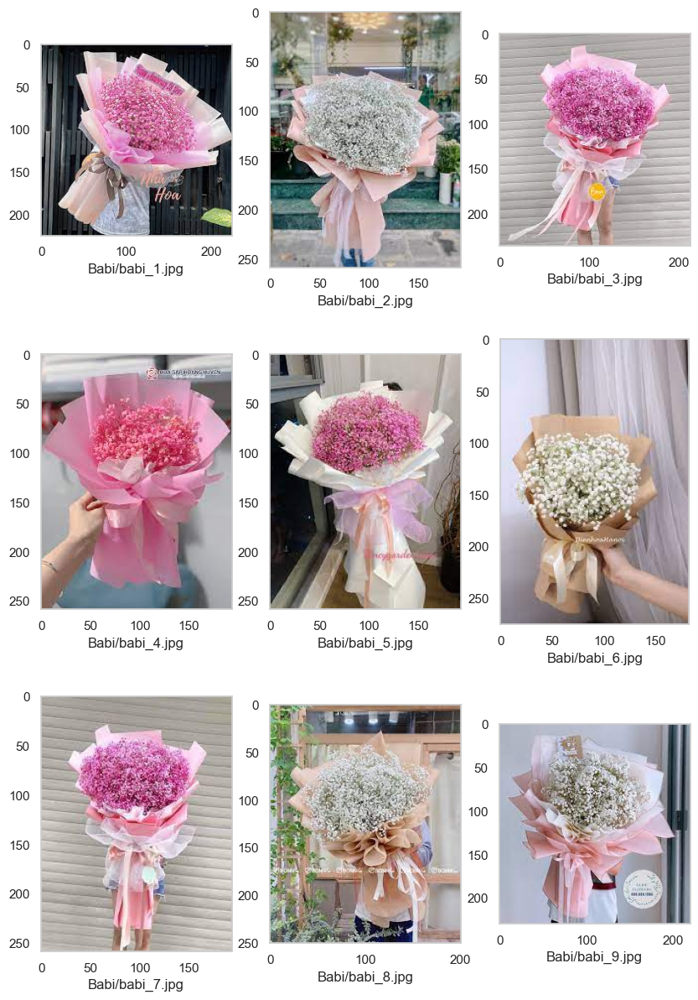

In [37]:
showImages(babi)

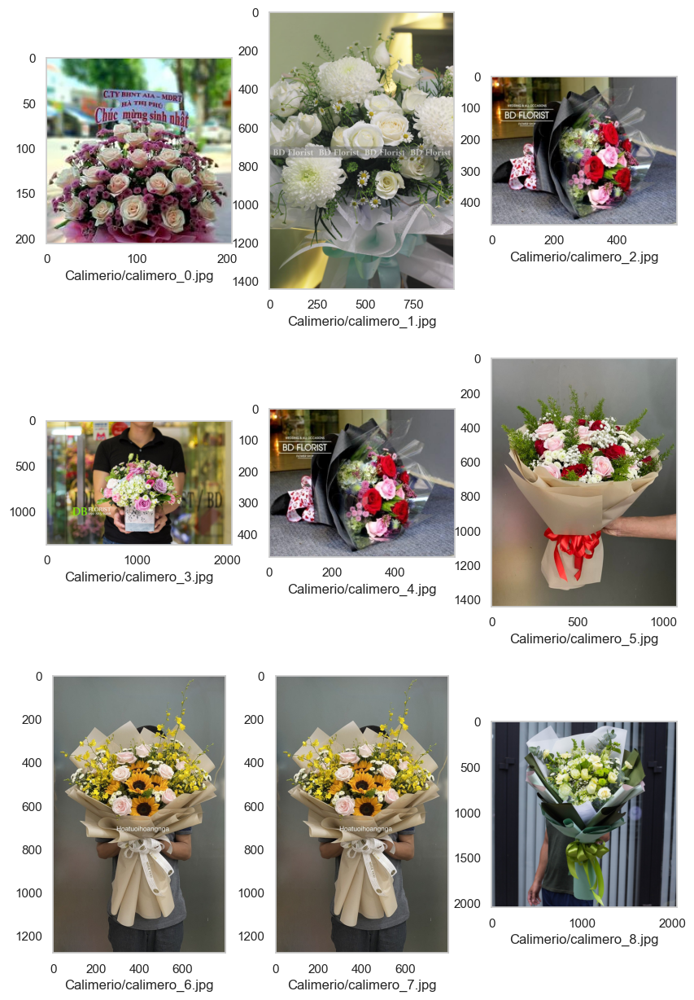

In [38]:
showImages(calimerio)

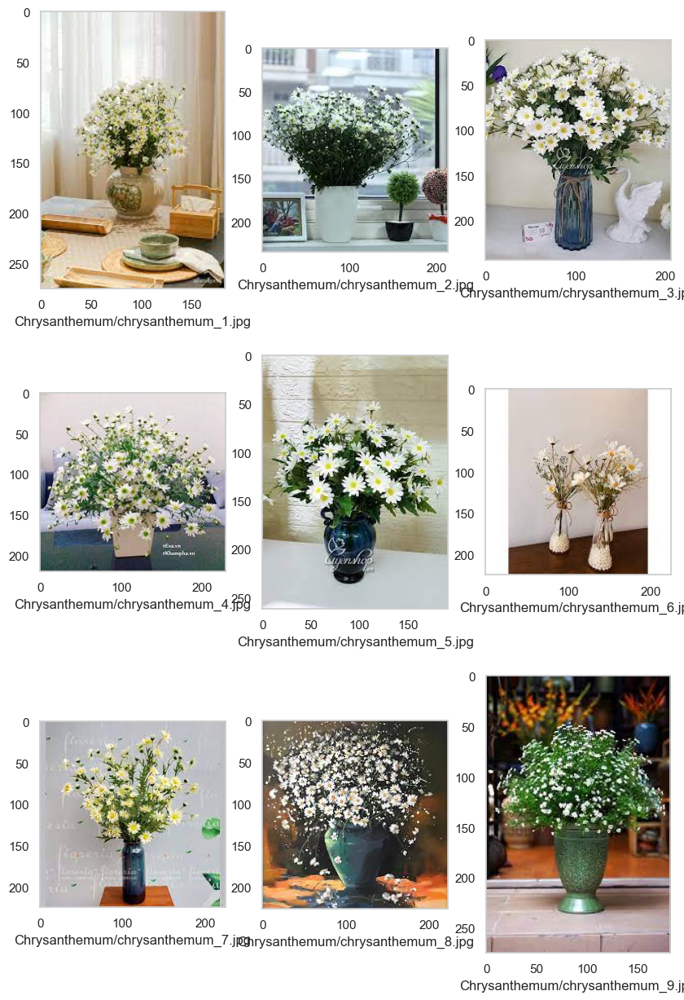

In [39]:
showImages(chrysanthemum)

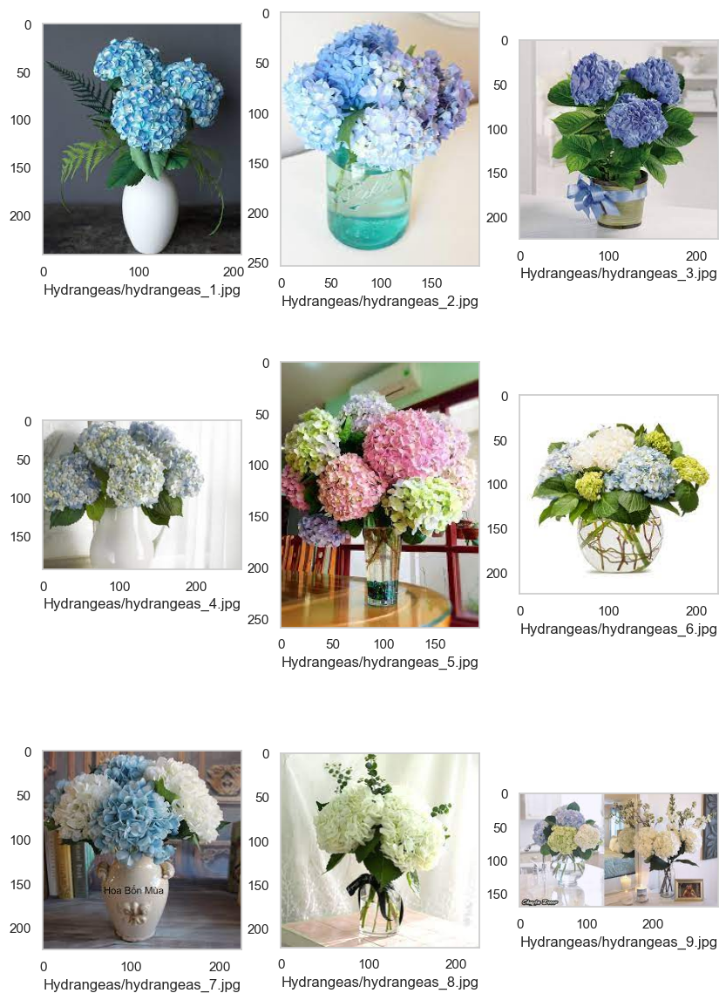

In [40]:
showImages(hydrangeas)

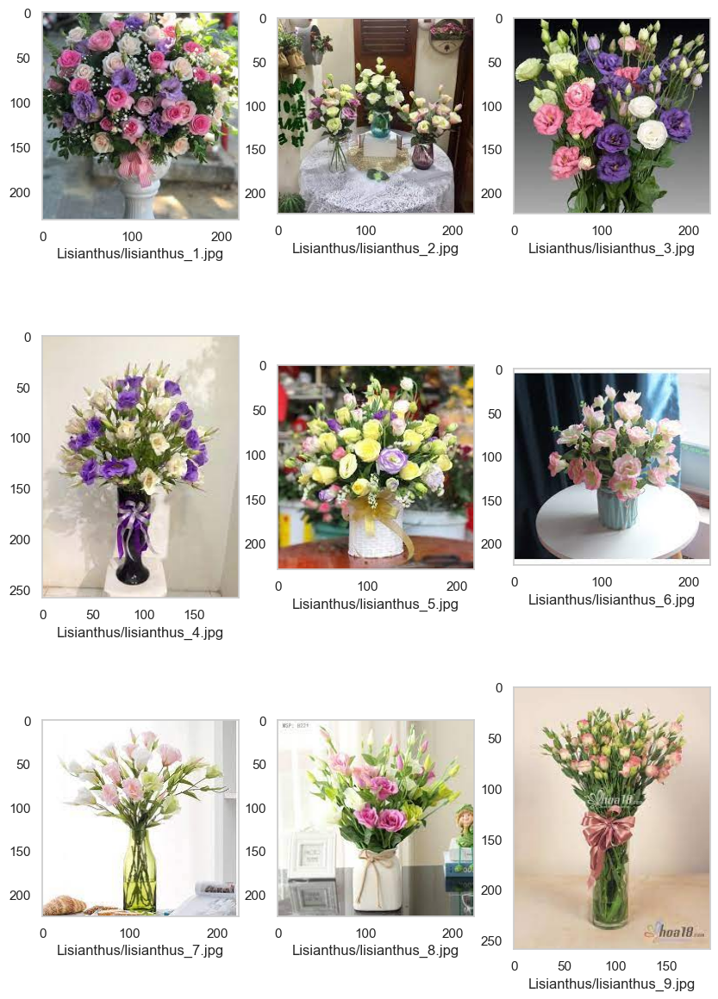

In [41]:
showImages(lisianthus)

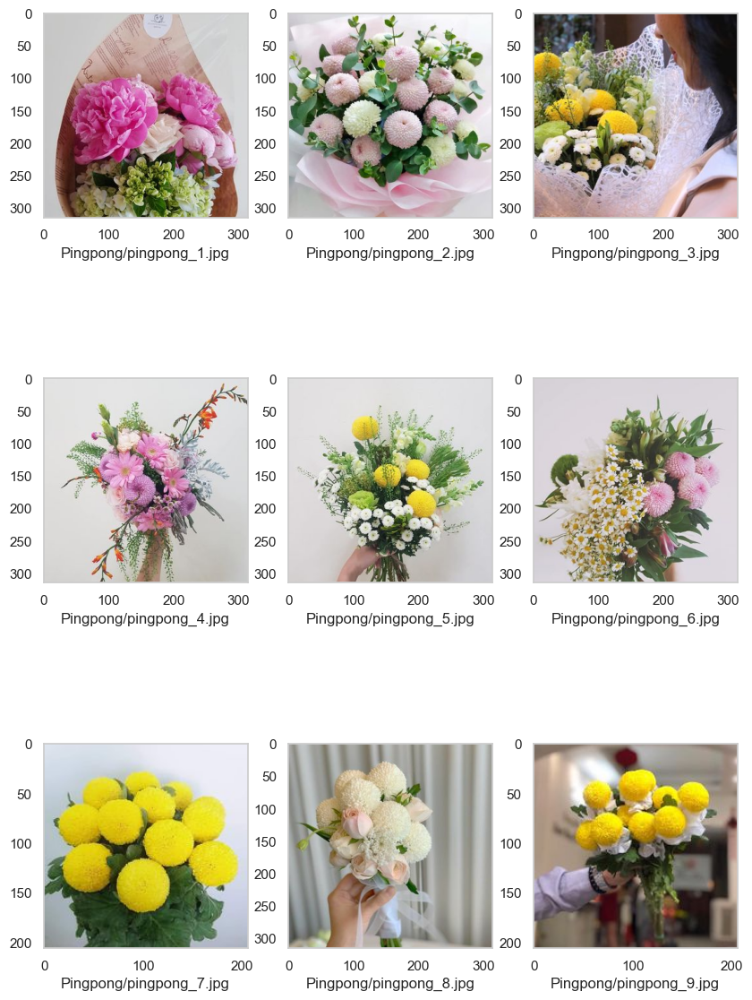

In [42]:
showImages(pingpong)

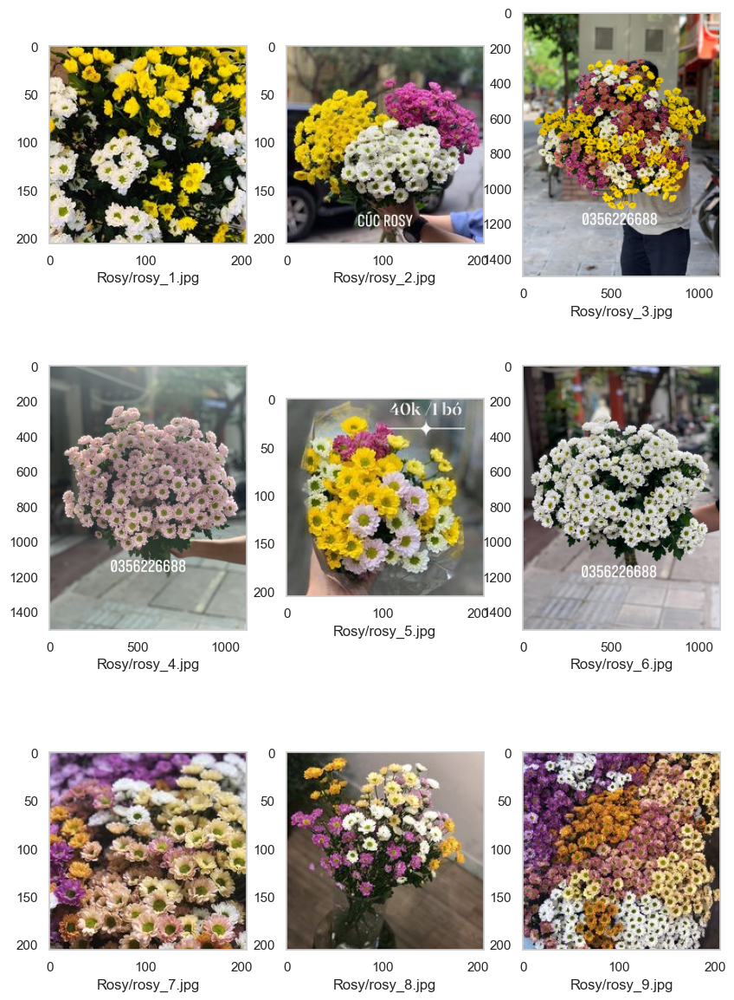

In [43]:
showImages(rosy)

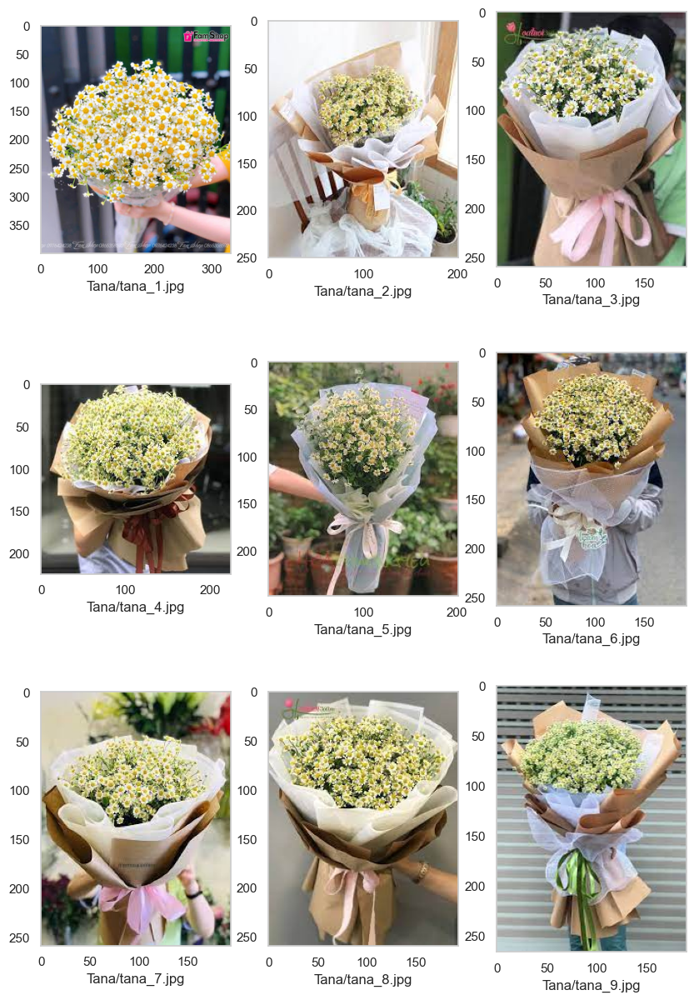

In [44]:
showImages(tana)

<a id='II'></a>
<h2 style='color:#4472C4;font-size:45px;font-family:helvetica;text-align:center;'>
    <strong>
    II. Exploratory Data Analysis
    </strong>
</h2>

* Number of file extensions

In [45]:
png_count = len(list(rootDataPath.glob("*/*.png")))
jpeg_count = len(list(rootDataPath.glob("*/*.jpg")))
gif_count = len(list(rootDataPath.glob("*/*.gif")))

print('PNG (.png): ', png_count)
print('JPG or JPEG (.jpg or .jpeg):', jpeg_count)
print('GIF (.gif):', gif_count)

PNG (.png):  0

JPG or JPEG (.jpg or .jpeg): 4621

GIF (.gif): 0


<a id='2.1'></a>
### **2.1.** Duplicated data
***

Looking at the image view in the Introduction section, it is possible to notice that a few of the photographs are identical, indicating the possibility of duplicated images. Based on the simple problem of checking duplicated number in a list, a cryptographic hashing technique is used to encrypt data image into unique hash value at first, store it into the dictionary and later check for unique.

In [46]:
'''
Check for duplicated images within a class

RETURN: a list of pair of duplicated images
'''
def checkDuplicate(flowerTypePath):
    unique_hashes = defaultdict(str)
    duplicateImgList = []

    imgDir = str(rootDataPath) + "/" + flowerTypePath

    # loop through each image
    for img in os.listdir(imgDir):
        with open(os.path.join(imgDir, img), "rb") as f:
            # use sha256 to hash the images
            hashed = hashlib.sha256(f.read()).hexdigest()
            if hashed in unique_hashes.values():
                # If the same hash value, get the index of the duplicated item then
                # store duplicated item into duplicated list based on its index.
                dupIdx = list(unique_hashes.values()).index(hashed)
                duplicateImgList.append((list(unique_hashes.keys())[dupIdx], img))
            else:
                # otherwise add it to the dictionary as unique item
                unique_hashes[img] = hashed
    
    return duplicateImgList

In [47]:
babi_Duplicate = checkDuplicate("Babi")
calimerio_Duplicate = checkDuplicate("Calimerio")
chrysanthemum_Duplicate = checkDuplicate("Chrysanthemum")
hydrangeas_Duplicate = checkDuplicate("Hydrangeas")
lisianthus_Duplicate = checkDuplicate("Lisianthus")
pingpong_Duplicate = checkDuplicate("Pingpong")
rosy_Duplicate = checkDuplicate("Rosy")
tana_Duplicate = checkDuplicate("Tana")

In [48]:
print("------------\nDuplicate amount in Babi class: ", len(babi_Duplicate))
print(babi_Duplicate)
print("------------\nDuplicate amount in Calimerio class: ", len(calimerio_Duplicate))
print(calimerio_Duplicate)
print("------------\nDuplicate amount in Chrysanthemum class: ", len(chrysanthemum_Duplicate))
print(chrysanthemum_Duplicate)
print("------------\nDuplicate amount in Hydrangeas class: ", len(hydrangeas_Duplicate))
print(hydrangeas_Duplicate)
print("------------\nDuplicate amount in Lisianthus class: ", len(lisianthus_Duplicate))
print(lisianthus_Duplicate)
print("------------\nDuplicate amount in Pingpong class: ", len(pingpong_Duplicate))
print(pingpong_Duplicate)
print("------------\nDuplicate amount in Rosy class: ", len(rosy_Duplicate))
print(rosy_Duplicate)
print("------------\nDuplicate amount in Tana class: ", len(tana_Duplicate))
print(tana_Duplicate)

------------

Duplicate amount in Babi class:  24

[('babi_338.jpg', 'babi_528.jpg'), ('babi_365.jpg', 'babi_570.jpg'), ('babi_837.jpg', 'babi_378.jpg'), ('babi_760.jpg', 'babi_813.jpg'), ('babi_422.jpg', 'babi_423.jpg'), ('babi_75.jpg', 'babi_221.jpg'), ('babi_774.jpg', 'babi_785.jpg'), ('babi_235.jpg', 'babi_236.jpg'), ('babi_426.jpg', 'babi_342.jpg'), ('babi_231.jpg', 'babi_828.jpg'), ('babi_197.jpg', 'babi_196.jpg'), ('babi_418.jpg', 'babi_357.jpg'), ('babi_222.jpg', 'babi_223.jpg'), ('babi_495.jpg', 'babi_442.jpg'), ('babi_536.jpg', 'babi_872.jpg'), ('babi_834.jpg', 'babi_523.jpg'), ('babi_836.jpg', 'babi_286.jpg'), ('babi_811.jpg', 'babi_535.jpg'), ('babi_372.jpg', 'babi_450.jpg'), ('babi_886.jpg', 'babi_691.jpg'), ('babi_349.jpg', 'babi_875.jpg'), ('babi_244.jpg', 'babi_243.jpg'), ('babi_483.jpg', 'babi_490.jpg'), ('babi_861.jpg', 'babi_526.jpg')]

------------

Duplicate amount in Calimerio class:  26

[('calimero_7.jpg', 'calimero_6.jpg'), ('calimero_208.jpg', 'calimero_10.jpg

In [49]:
def showDuplicateImages(duplicatePair, flowerClass):
    plt.figure(figsize=(10,15))
    plt.title("Duplicated images in " + flowerClass)
    i = 0 # N.o in subplot display

    for item in duplicatePair:
        img = plt.imread("data/Flowers/" + flowerClass + "/" + item)
        plt.subplot(1,2,i+1)
        plt.xlabel(item)
        plt.grid(visible= False)
        plt.imshow(img)
        i += 1

/var/folders/b8/0ypjrgws0sb2khwnc7w__m7c0000gn/T/ipykernel_9981/1556697499.py:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.

  plt.subplot(1,2,i+1)


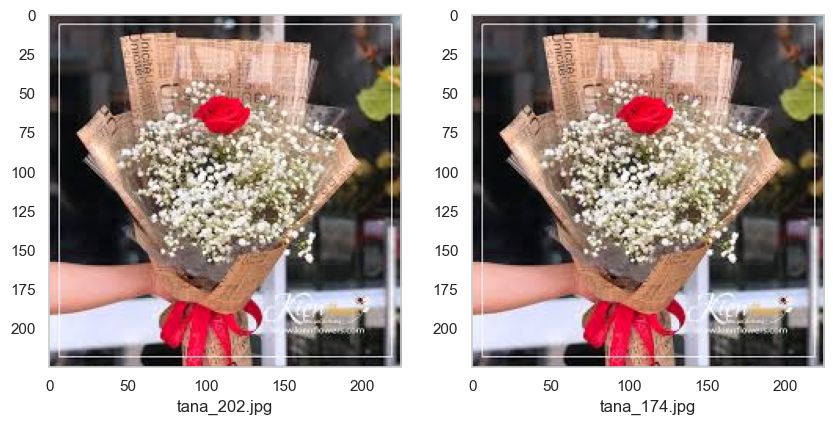

In [50]:
showDuplicateImages(tana_Duplicate[0], "Tana")

<a id='2.2'></a>
### **2.2.** Unbalanced samples
***

In the given dataset, there is a disparity in the data amount among classes, which is causing bias in classifying images whatever the higher accuracy score.

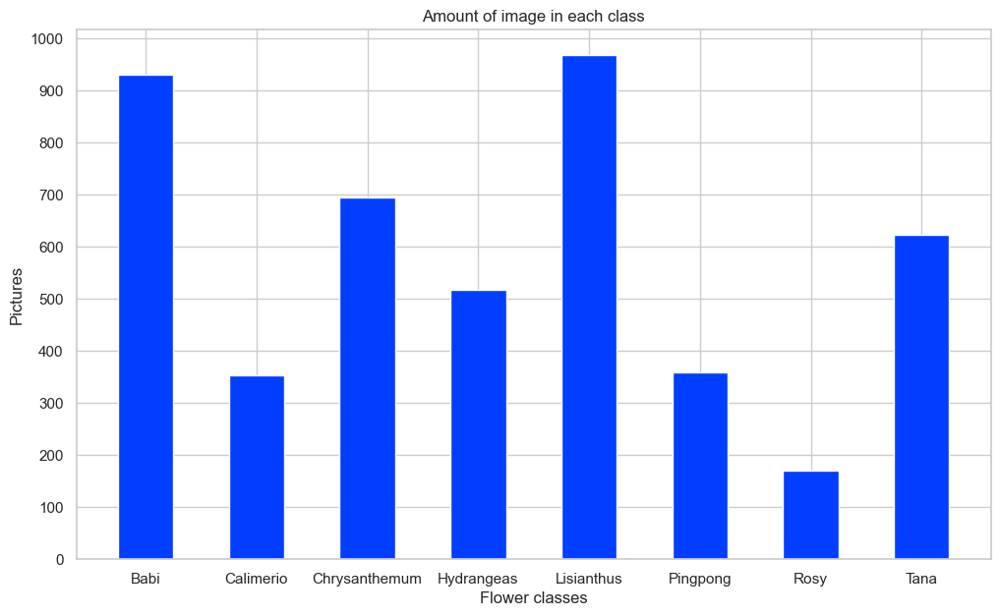

In [51]:
# Store flower classes into a single dictionary
flowerClassAmount = {'Babi': len(babi),
                     'Calimerio': len(calimerio),
                     'Chrysanthemum': len(chrysanthemum),
                     'Hydrangeas': len(hydrangeas),
                     'Lisianthus': len(lisianthus),
                     'Pingpong': len(pingpong),
                     'Rosy': len(rosy),
                     'Tana': len(tana)}

fig = plt.figure(figsize=(12,7))
plt.yticks([0,100,200,300,400,500,600,700,800,900,1000])
plt.title('Amount of image in each class')
plt.ylabel('Pictures')
plt.xlabel('Flower classes')
fig = plt.bar(flowerClassAmount.keys(), flowerClassAmount.values(), width=.5)
plt.show()

<a id='2.3'></a>
### **2.3.** Inconsistency size/ resolution
***

In each class, the images are captured in different ways (portrait, landscape, etc), causing the wide distribution in resolution.

In [52]:
'''
Count the unique amount of image resolution in a flower class

RETURN: a frequency dictionary
'''
def checkImageResFrequency(flowerType):
    frequency = {}

    for flowerTypePath in flowerType:
        image = PIL.Image.open(flowerTypePath)

        imageSize = image.size

        # checking the element in dictionary
        if imageSize in frequency:
            # incrementing the counr
            frequency[imageSize] += 1
        else:
            # initializing the count
            frequency[imageSize] = 1
    
    return frequency

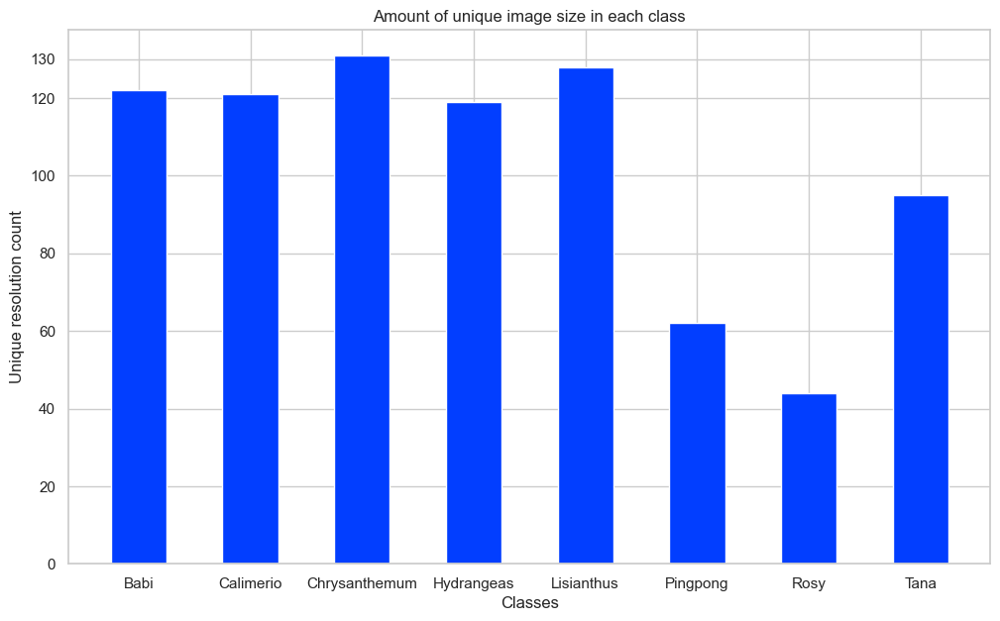

In [53]:
resolutionFreq = {'Babi': len(checkImageResFrequency(babi)),
                     'Calimerio': len(checkImageResFrequency(calimerio)),
                     'Chrysanthemum': len(checkImageResFrequency(chrysanthemum)),
                     'Hydrangeas': len(checkImageResFrequency(hydrangeas)),
                     'Lisianthus': len(checkImageResFrequency(lisianthus)),
                     'Pingpong': len(checkImageResFrequency(pingpong)),
                     'Rosy': len(checkImageResFrequency(rosy)),
                     'Tana': len(checkImageResFrequency(tana))}

fig = plt.figure(figsize=(12,7))
plt.yticks([0,20,40,60,80,100,120,130])
plt.title('Amount of unique image size in each class')
plt.ylabel('Unique resolution count')
plt.xlabel('Classes')
fig = plt.bar(resolutionFreq.keys(), resolutionFreq.values(), width=.5)
plt.show()

From the above graph, over half of flower class have wide range of image resolution (> 100 unique size) except for Pingpong, Rosy and Tana.

For *Babi* class, there are 340 images have the size of (225, 225)
>NOTE: The size of image is defined as a tuple variable (width, height) format.

To visualise image size among classes clearly, we have plot them out as scatter plot, which takes Width and Height, for comparison purpose.

In [369]:
# Get the size frequency among classes
babi_Freq = checkImageResFrequency(babi)
calimerio_Freq = checkImageResFrequency(calimerio)
chrysanthemum_Freq = checkImageResFrequency(chrysanthemum)
hydrangeas_Freq = checkImageResFrequency(hydrangeas)
lisianthus_Freq = checkImageResFrequency(lisianthus)
pingpong_Freq = checkImageResFrequency(pingpong)
rosy_Freq = checkImageResFrequency(rosy)
tana_Freq = checkImageResFrequency(tana)


In [370]:
# Create stored dictionaries for converting to dataframe later
imgResDict_babi = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict_calimerio = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict_chrysanthemum = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict_hydrangeas = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict_lisianthus = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict_pingpong = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict_rosy = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict_tana = {'Size': [], 'W': [], 'H': [], 'Frequency': [], 'Ratio': []}
imgResDict = [imgResDict_babi, imgResDict_calimerio, imgResDict_chrysanthemum, imgResDict_hydrangeas,
imgResDict_lisianthus, imgResDict_pingpong, imgResDict_rosy, imgResDict_tana]

'''
Convert dictionary to a dataframe

RETURN: A pandas dataframe
'''
def dict2df(dictionary, className):
    idx = 0
    if className == 'babi': idx = 0
    elif className == 'calimerio': idx = 1
    elif className == 'chrysanthemum': idx = 2
    elif className == 'hydrangeas': idx = 3
    elif className == 'lisianthus': idx = 4
    elif className == 'pingpong': idx = 5
    elif className == 'rosy': idx = 6
    else: idx = 7

    for k, v in dictionary.items():
        imgResDict[idx]['Size'].append(k)
        imgResDict[idx]['W'].append(k[0])
        imgResDict[idx]['H'].append(k[1])
        imgResDict[idx]['Frequency'].append(v)
        imgResDict[idx]['Ratio'].append(round((k[0]/k[1]),2))
    
    imgResFreq_df = pd.DataFrame(imgResDict[idx])
    return imgResFreq_df


In [372]:
# Create dataframes for plotting purpose
babiFreq_df = dict2df(babi_Freq, 'babi')
calimerioFreq_df = dict2df(calimerio_Freq, 'calimerio')
chrysanthemumFreq_df = dict2df(chrysanthemum_Freq, 'chrysanthemum')
hydrangeasFreq_df = dict2df(hydrangeas_Freq, 'hydrangeas')
lisianthusFreq_df = dict2df(lisianthus_Freq, 'lisianthus')
pingpongFreq_df = dict2df(pingpong_Freq, 'pingpong')
rosyFreq_df = dict2df(rosy_Freq, 'rosy')
tanaFreq_df = dict2df(tana_Freq, 'tana')

In [373]:
'''
Plot the dataframe corressponding to class as scatter plot
'''
def plotResDist(df, className):
    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111)
    points = ax.scatter(df["W"], df['H'], color='blue', alpha=0.3, s=df["Ratio"]*100, picker=True)
    ax.set_title(f"Image Resolution Distribution of {className}")
    ax.set_xlabel("Width")
    ax.set_ylabel("Height")

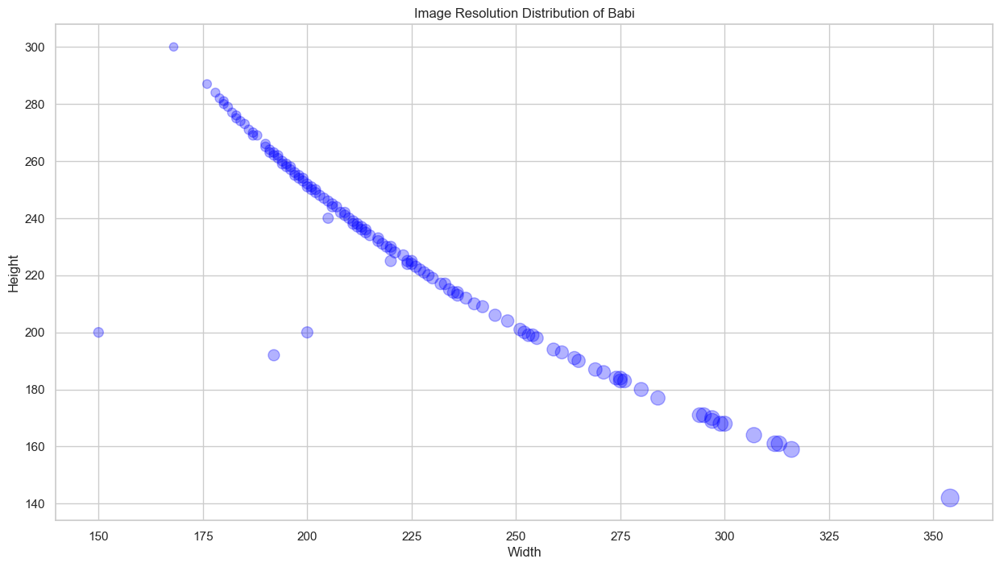

In [361]:
plotResDist(babiFreq_df, 'Babi')

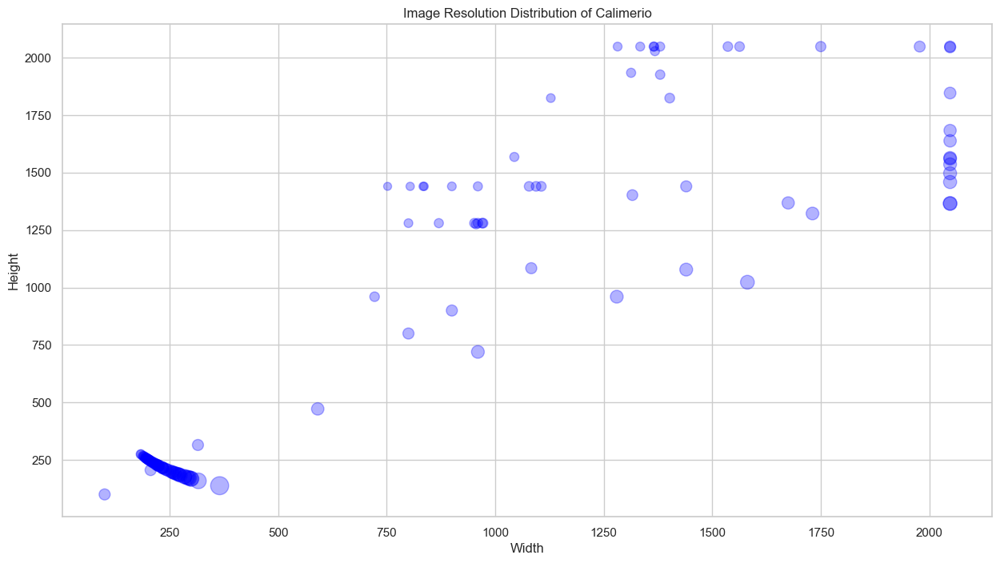

In [362]:
plotResDist(calimerioFreq_df, 'Calimerio')

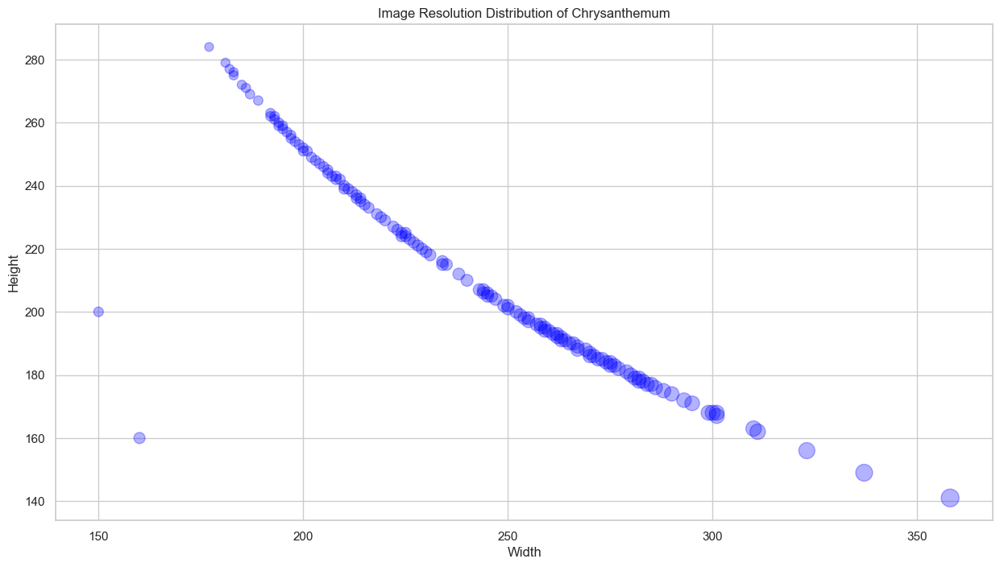

In [363]:
plotResDist(chrysanthemumFreq_df, 'Chrysanthemum')

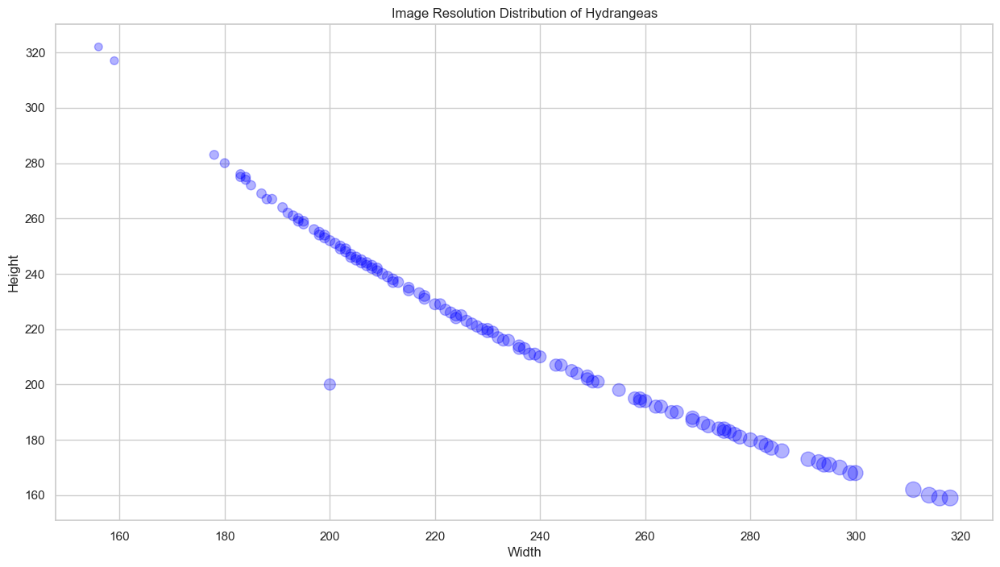

In [364]:
plotResDist(hydrangeasFreq_df, 'Hydrangeas')

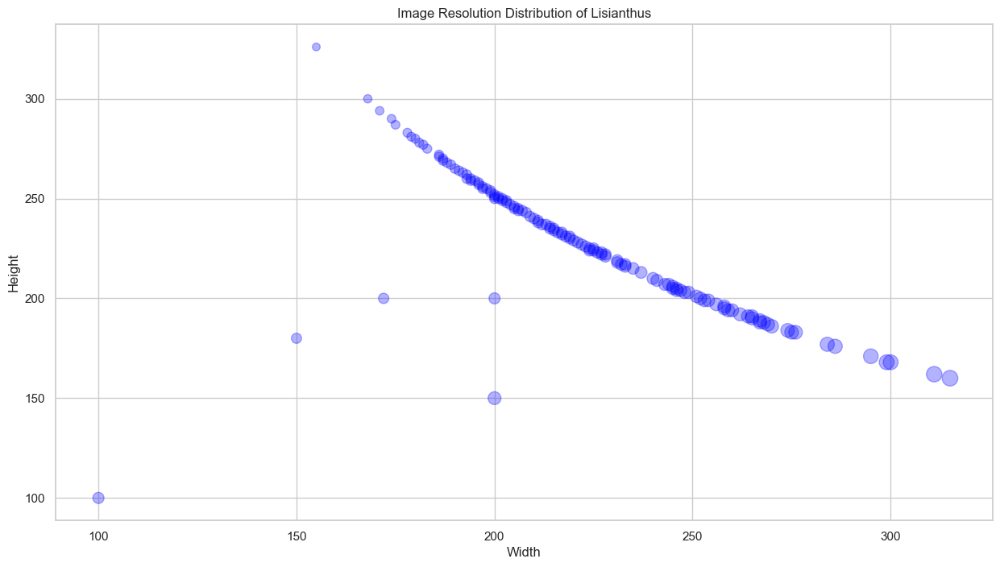

In [365]:
plotResDist(lisianthusFreq_df, 'Lisianthus')

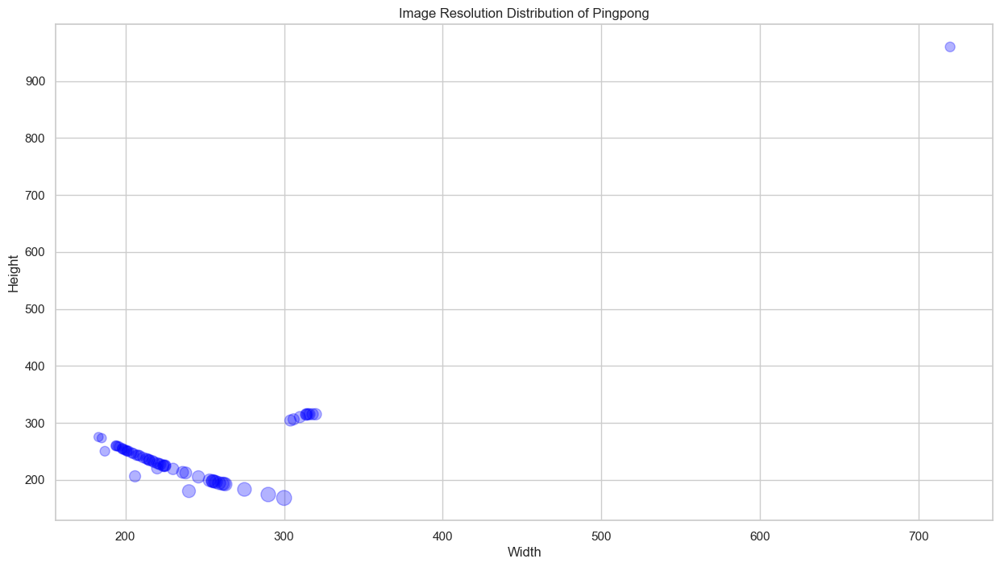

In [366]:
plotResDist(pingpongFreq_df, 'Pingpong')

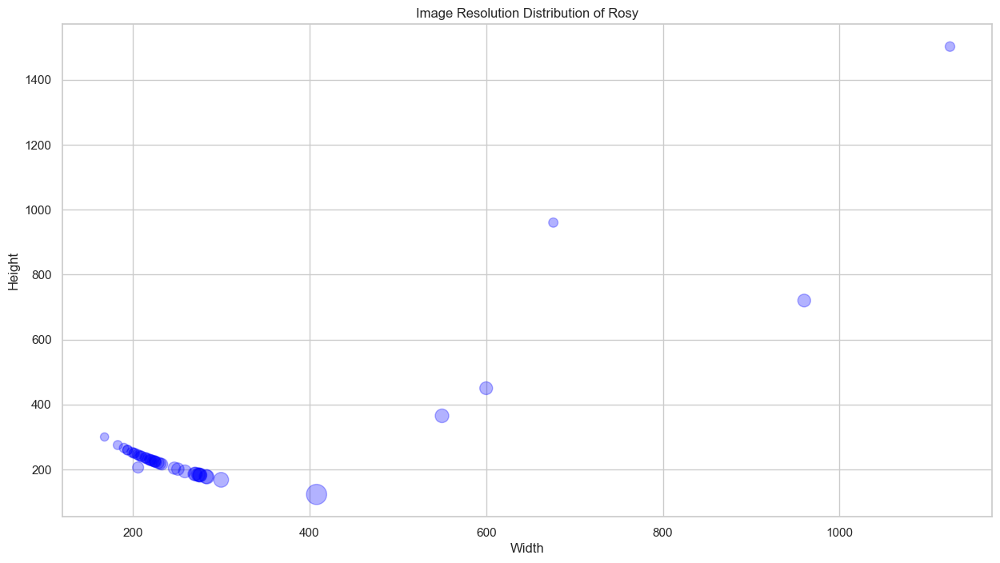

In [367]:
plotResDist(rosyFreq_df, 'Rosy')

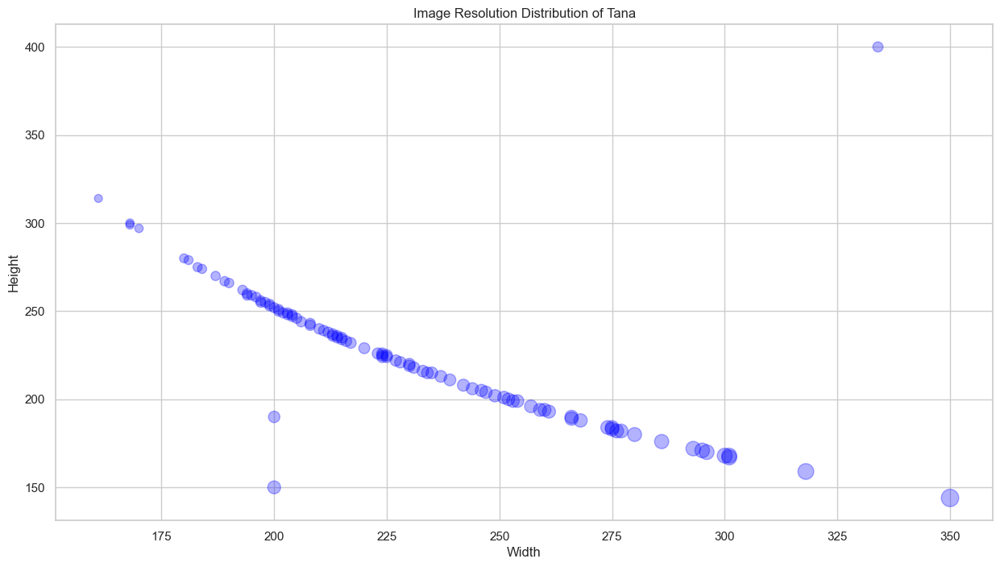

In [368]:
plotResDist(tanaFreq_df, 'Tana')

<a id='2.4'></a>
### **2.4.** Unwanted features
***

The majority of photographs combine the intended subject (flowers) with other elements (human hands, pots, advertisements, text, tables, etc.). These photos are believed to be challenging for the model to identify as the primary objects it needs to learn.

In [55]:
"""
Show images in a 3x3 grid based on given list
"""
def showImageList(imageList):
    plt.figure(figsize=(10,12))
    i = 0 # N.o in subplot display

    for imgPath in imageList:
        img = plt.imread(imgPath)
        plt.subplot(3,3,i+1)
        plt.grid(visible= False)
        plt.imshow(img)
        i += 1

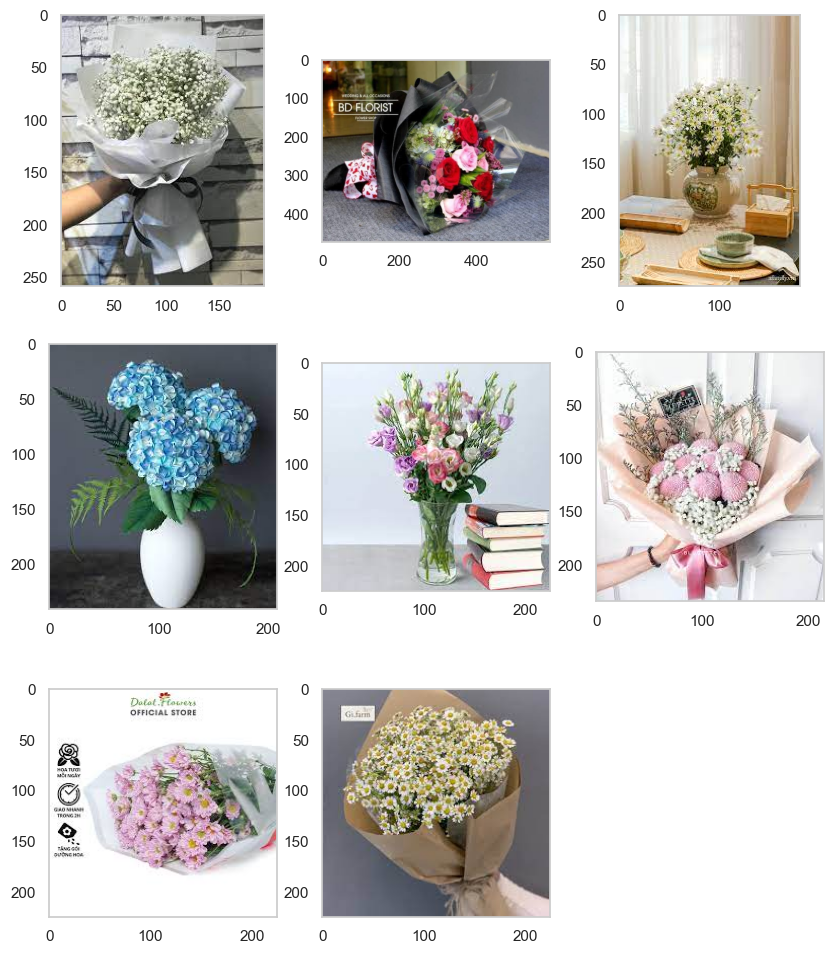

In [56]:
showImageList([babi[13], calimerio[2], chrysanthemum[0], hydrangeas[0], lisianthus[24], pingpong[69], rosy[50], tana[49]])

<a id='2.5'></a>
### **2.5.** Collage images
***

After looking at the entire data set, we noticed that there are collage images (sub-images within an image) although the possibility of that happening is quite rare. This is still a problem that need to be considered because it makes the model confuse in classifying the target object class.

In [57]:
'''
Display photo collage
'''
def showCollageImages(imgPath):
    img = plt.imread(imgPath)
    plt.grid(False)
    plt.imshow(img)


In [58]:
# List of collage images in all classes
collageImages = {
    'Babi': ['./data/Flowers/Babi/babi_301.jpg',
             './data/Flowers/Babi/babi_302.jpg',
             './data/Flowers/Babi/babi_316.jpg',
             './data/Flowers/Babi/babi_519.jpg',
             './data/Flowers/Babi/babi_521.jpg',
             './data/Flowers/Babi/babi_557.jpg',
             './data/Flowers/Babi/babi_615.jpg',
             './data/Flowers/Babi/babi_616.jpg',
             './data/Flowers/Babi/babi_629.jpg',
             './data/Flowers/Babi/babi_635.jpg',
             './data/Flowers/Babi/babi_636.jpg',
             './data/Flowers/Babi/babi_638.jpg',
             './data/Flowers/Babi/babi_653.jpg',
             './data/Flowers/Babi/babi_664.jpg',
             './data/Flowers/Babi/babi_698.jpg',],

    'Calimerio': ['./data/Flowers/Calimerio/calimero_50.jpg',
                  './data/Flowers/Calimerio/calimero_76.jpg',
                  './data/Flowers/Calimerio/calimero_89.jpg',
                  './data/Flowers/Calimerio/calimero_132.jpg',
                  './data/Flowers/Calimerio/calimero_145.jpg',
                  './data/Flowers/Calimerio/calimero_226.jpg',
                  './data/Flowers/Calimerio/calimero_241.jpg',],
    
    'Chrysanthemum': ['./data/Flowers/Chrysanthemum/chrysanthemum_34.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_74.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_81.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_106.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_129.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_158.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_202.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_240.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_277.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_288.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_327.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_357.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_370.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_379.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_407.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_408.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_492.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_495.jpg',
                      './data/Flowers/Chrysanthemum/chrysanthemum_625.jpg'],
    
    'Hydrangeas': ['./data/Flowers/Hydrangeas/hydrangeas_9.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_73.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_78.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_105.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_174.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_254.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_269.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_304.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_344.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_352.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_403.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_462.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_497.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_501.jpg',
                   './data/Flowers/Hydrangeas/hydrangeas_502.jpg'],
    
    'Lisianthus': ['./data/Flowers/Lisianthus/lisianthus_36.jpg',
                   './data/Flowers/Lisianthus/lisianthus_44.jpg',
                   './data/Flowers/Lisianthus/lisianthus_63.jpg',
                   './data/Flowers/Lisianthus/lisianthus_65.jpg',
                   './data/Flowers/Lisianthus/lisianthus_81.jpg',
                   './data/Flowers/Lisianthus/lisianthus_117.jpg',
                   './data/Flowers/Lisianthus/lisianthus_123.jpg',
                   './data/Flowers/Lisianthus/lisianthus_127.jpg',
                   './data/Flowers/Lisianthus/lisianthus_128.jpg',
                   './data/Flowers/Lisianthus/lisianthus_261.jpg',
                   './data/Flowers/Lisianthus/lisianthus_583.jpg',
                   './data/Flowers/Lisianthus/lisianthus_659.jpg',
                   './data/Flowers/Lisianthus/lisianthus_729.jpg',
                   './data/Flowers/Lisianthus/lisianthus_747.jpg',
                   './data/Flowers/Lisianthus/lisianthus_761.jpg',
                   './data/Flowers/Lisianthus/lisianthus_787.jpg'],

    'Pingpong': ['./data/Flowers/Pingpong/pingpong_236.jpg'],

    'Rosy': ['./data/Flowers/Rosy/rosy_127.jpg'],

    'Tana': ['./data/Flowers/Tana/tana_74.jpg',
             './data/Flowers/Tana/tana_91.jpg',
             './data/Flowers/Tana/tana_118.jpg',
             './data/Flowers/Tana/tana_130.jpg',
             './data/Flowers/Tana/tana_155.jpg',
             './data/Flowers/Tana/tana_217.jpg',
             './data/Flowers/Tana/tana_218.jpg',
             './data/Flowers/Tana/tana_228.jpg',
             './data/Flowers/Tana/tana_248.jpg',
             './data/Flowers/Tana/tana_267.jpg',
             './data/Flowers/Tana/tana_285.jpg',
             './data/Flowers/Tana/tana_319.jpg',
             './data/Flowers/Tana/tana_353.jpg',
             './data/Flowers/Tana/tana_437.jpg',
             './data/Flowers/Tana/tana_475.jpg',
             './data/Flowers/Tana/tana_488.jpg']
}

* *Babi*

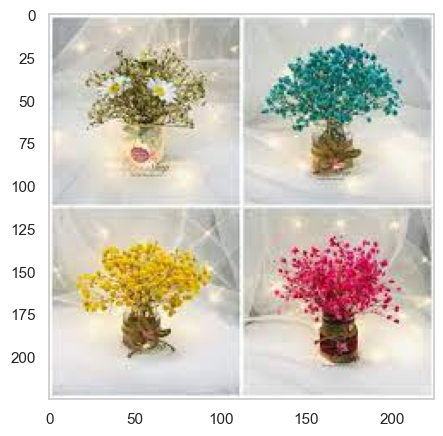

In [59]:
showCollageImages(collageImages.get('Babi')[3])

* *Calimerio*

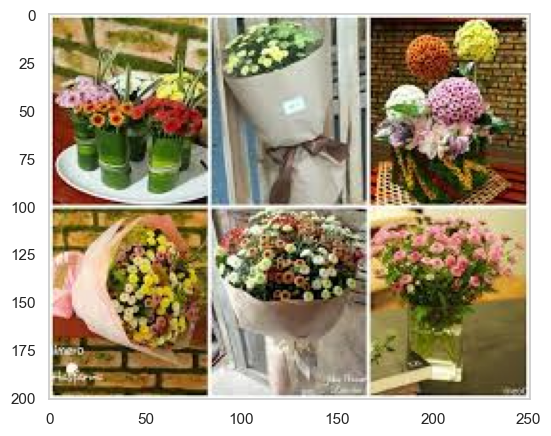

In [60]:
showCollageImages(collageImages.get('Calimerio')[3])

* *Chrysanthemum*

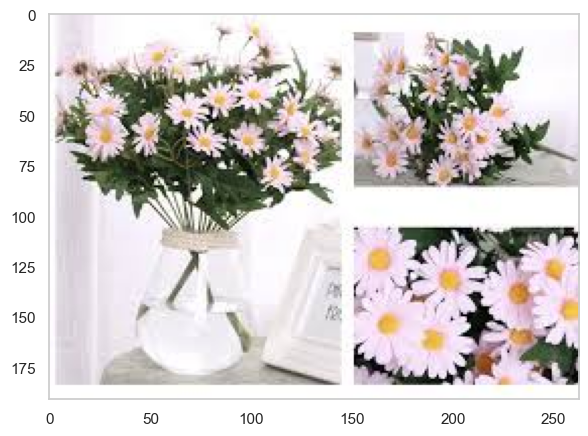

In [61]:
showCollageImages(collageImages.get('Chrysanthemum')[3])

* *Hydrangeas*

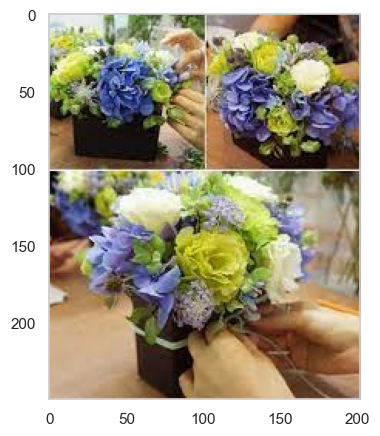

In [62]:
showCollageImages(collageImages.get('Hydrangeas')[1])

* *Lisianthus*

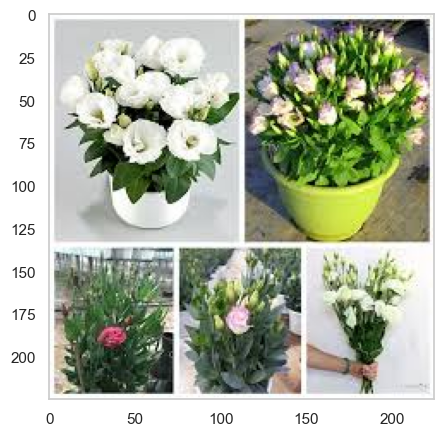

In [63]:
showCollageImages(collageImages.get('Lisianthus')[0])

* *Pingpong*

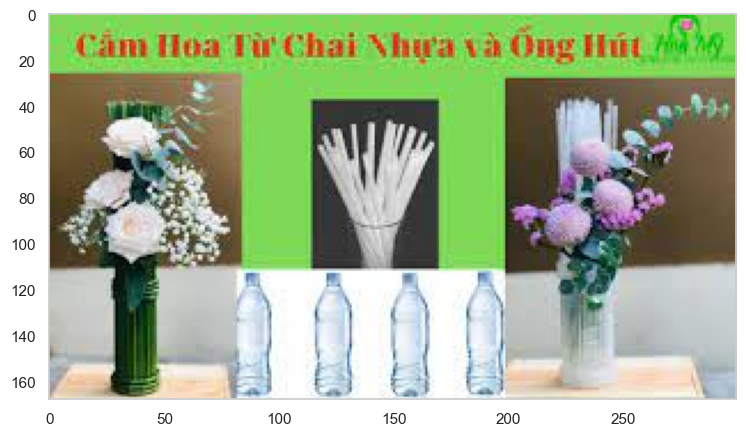

In [64]:
showCollageImages(collageImages.get('Pingpong')[0])

* *Rosy*

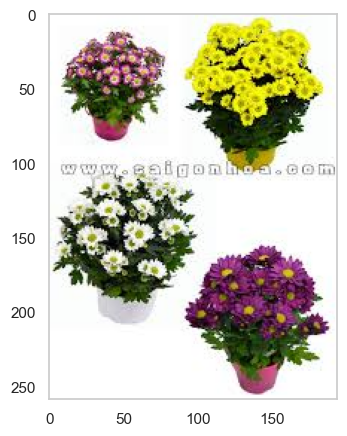

In [65]:
showCollageImages(collageImages.get('Rosy')[0])

* *Tana*

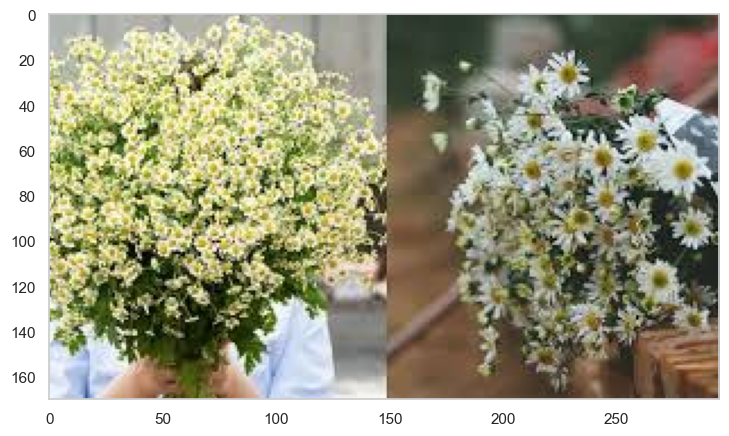

In [66]:
showCollageImages(collageImages.get('Tana')[3])

### Problems found in EDA section:
* `Duplicated images`
* `Unbalanced samples`
* `Inconsistency size/ resolution`
* `Unwanted features`
* `Collage images`

<a id='III'></a>
<h2 style='color:#4472C4;font-size:45px;font-family:helvetica;text-align:center;'>
    <strong>
    III. Data Cleaning and Pre-processing
    </strong>
</h2>

In this section, the team will do modifications on the given dataset to handle aforementioned issues in the EDA section before feeding them into the models.

At first, we put all of these into a single dataframe to further process the data in structural way.

In [67]:
croppedDataPath = './data/cropped_data/'
labels = ['Babi', 'Calimerio', 'Chrysanthemum', 'Hydrangeas', 'Lisianthus', 'Pingpong', 'Rosy', 'Tana']

# Temporarily store data in a dictionary with pair of image path (key) and class (value)
data = {'ImagePath': [], 'Class': []}

for label in labels:
    label_dir = os.path.join(croppedDataPath, label)
    for filename in os.listdir(label_dir):

        # Ignore '.DS_Store' file (on MacOS) and 'desktop.ini' (on Windows)
        if (filename != '.DS_Store' and filename != 'desktop.ini'):
            filepath = os.path.join(label_dir, filename)
            data['ImagePath'].append(filepath)
            data['Class'].append(label)

# Create a dataframe with two columns: 'Image Path' and 'Class'.
df = pd.DataFrame(data)

In [68]:
df

,ImagePath,Class
0,./data/cropped_data/Babi/babi_926.jpg,Babi
1,./data/cropped_data/Babi/babi_729.jpg,Babi
2,./data/cropped_data/Babi/babi_701.jpg,Babi
3,./data/cropped_data/Babi/babi_715.jpg,Babi
4,./data/cropped_data/Babi/babi_587.7.jpg,Babi
...,...,...
5162,./data/cropped_data/Tana/tana_569.jpg,Tana
5163,./data/cropped_data/Tana/tana_233.jpg,Tana
5164,./data/cropped_data/Tana/tana_555.jpg,Tana
5165,./data/cropped_data/Tana/tana_541.jpg,Tana


In [69]:
# os.makedirs('./data/cleansed_data/Babi')
# os.makedirs('./data/cleansed_data/Calimerio')
# os.makedirs('./data/cleansed_data/Chrysanthemum')
# os.makedirs('./data/cleansed_data/Hydrangeas')
# os.makedirs('./data/cleansed_data/Lisianthus')
# os.makedirs('./data/cleansed_data/Pingpong')
# os.makedirs('./data/cleansed_data/Rosy')
# os.makedirs('./data/cleansed_data/Tana')

<a id='3.1'></a>
### **3.1.** Centralise target object
***

 In the previous section, we know that there are few collage images and also images whose target object is surrounded by extra objects (table, pot, human hand, advertisement, etc), consuming more time to classify the target object for the model and may causing mis-classification. Hence, this part is supposed to centralise the main target (flower) to train the model in ease.

Since the code is extensively heavy, it is already run in the school computer lab so we will comment it out to save time for running this notebook.

In [70]:
#!pip install torchvision

In [71]:
#import torch
#import torchvision
#from torchvision import transforms as T

In [72]:
# Initialize pre-trained model
#model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)

#model.eval()

In [73]:
def denoise(imgPath): 
    img = cv2.imread(imgPath)
    dst = cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21)

    outPath = "denoised" + str(imgPath.split("/")[len(imgPath.split("/"))-1].split(".")[0]) +  ".jpg"

    cv2.imwrite(outPath, dst)

    return outPath

In [74]:
def calArea(bbox):
    x_left = bbox[0][0]
    y_top = bbox[0][1]
    x_right = bbox[1][0]
    y_bottom = bbox[1][1]

    return (x_right - x_left) * (y_bottom - y_top)

In [75]:
def calOverlap(bb1, bb2):
    # determine the coordinates of the intersection rectangle
    x_left = max(bb1[0][0], bb2[0][0])
    y_top = max(bb1[0][1], bb2[0][1])
    x_right = min(bb1[1][0], bb2[1][0])
    y_bottom = min(bb1[1][1], bb2[1][1])

    if x_right < x_left or y_bottom < y_top:
        return 0.0, 0
    
    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1[1][0] - bb1[0][0]) * (bb1[1][1] - bb1[0][1])
    bb2_area = (bb2[1][0] - bb2[0][0]) * (bb2[1][1] - bb2[0][1])

    percent = intersection_area/min(bb1_area, bb2_area)

    return percent, 1 if bb1_area < bb2_area else 2

In [76]:
def detectObject(imgPath):
    NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
    ]
    
    img = PIL.Image.open(imgPath)

    transform = T.ToTensor()
    image = transform(img)

    with torch.no_grad():
        pred = model([image])

    # bbox, lables, scores = pred[0]["boxes"], pred[0]["labels"], pred[0]["scores"]

    pred_class = [NAMES[i] for i in list(pred[0]['labels'].numpy())]
    
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
    pred_score = list(pred[0]['scores'].detach().numpy())

    if len(pred_class) < 1:
        return list(), list()

    confidence = 0.2

    try:
        pred_t = [pred_score.index(x) for x in pred_score if x > confidence][-1]
    except:
        return list(), list()
        
    pred_boxes = pred_boxes[:pred_t+1]

    pred_class = pred_class[:pred_t+1]

    pred_boxes = list(list(
        tuple(int(n) for n in pred_boxes[k][i]) for i in range(len(pred_boxes[k])) ) for k in range(len(pred_boxes)))

    # print(imgPath, pred_class, pred_boxes)
    disc_class = list()
    disc_box = list()

    out = list()

    objects = ["potted plant", "broccoli"]

    for i in range(len(pred_class)):
        if i in out: continue

        flag = False

        for k in range(i, len(pred_class)):
            if k in out: continue

            if i != k and pred_class[k] == pred_class[i] and (pred_class[i] in objects):
                # print(pred_boxes[i], pred_boxes[k])
                percent, id = calOverlap( pred_boxes[i], pred_boxes[k])

                if  percent >= 0.9:

                    if calArea(pred_boxes[i if id == 1 else k]) < 3000:
                        continue

                    flag = True
                    
                    disc_class.append(pred_class[i if id == 1 else k])

                    out.append(k if id == 1 else i)

                    disc_box.append(pred_boxes[i if id == 1 else k])

        if (pred_class[i] in objects) and (pred_boxes[i] not in disc_box) and not flag and calArea(pred_boxes[i]) > 3000:
            disc_class.append(pred_class[i])

            out.append(i)
            
            disc_box.append(pred_boxes[i])


    return disc_class, disc_box

The produced images are put into a newly separated folder named `cropped_data`.

<a id='3.2'></a>
### **3.2.** Scale down
***

The original set whose image files have various sizes, causing the inconsistent dimensions among classes. Hence, we decide to pick the optimal dimension (32x32) for training purpose, meaning the image will be scale-down though it comes at the cost of reducing image quality (image pixel lost).

In [278]:
for file in os.listdir('./data/cleansed_data/_calimerio/'):
    if (file != '.DS_Store'):
        path = './data/cleansed_data/_calimerio/' + file
        print(path)
        img = cv2.imread(path)
        imgNO = file.split('_')[1]
        imgNO = file.replace('.jpg', '')
        imgNO = imgNO.split('_')[1]
        print(imgNO)
        name = './data/cleansed_data/Calimerio/calimerio_' + str(imgNO) + '.jpg'
        cv2.imwrite(name, img)

./data/cleansed_data/_calimerio/calimero_236.jpg

236

./data/cleansed_data/_calimerio/calimero_145.9.jpg

145.9

./data/cleansed_data/_calimerio/calimero_222.jpg

222

./data/cleansed_data/_calimerio/calimero_16.jpg

16

./data/cleansed_data/_calimerio/calimero_312.6.jpg

312.6

./data/cleansed_data/_calimerio/calimero_4.jpg

4

./data/cleansed_data/_calimerio/calimero_183.jpg

183

./data/cleansed_data/_calimerio/calimero_197.jpg

197

./data/cleansed_data/_calimerio/calimero_140.jpg

140

./data/cleansed_data/_calimerio/calimero_154.jpg

154

./data/cleansed_data/_calimerio/calimero_168.jpg

168

./data/cleansed_data/_calimerio/calimero_342.jpg

342

./data/cleansed_data/_calimerio/calimero_343.jpg

343

./data/cleansed_data/_calimerio/calimero_316.3.jpg

316.3

./data/cleansed_data/_calimerio/calimero_169.jpg

169

./data/cleansed_data/_calimerio/calimero_155.jpg

155

./data/cleansed_data/_calimerio/calimero_141.jpg

141

./data/cleansed_data/_calimerio/calimero_189.5.jpg

189.5



In [77]:
RESIZED_DIMENSION = (100,100)

In [78]:
from tqdm import tqdm

# Using iterrows() function to loop through the dataframe
for idx, row in tqdm(df.iterrows()):
  #  --Testing-- print('Scaling image', idx, "|", row['ImagePath'])

   imgName = row['ImagePath'].split('/')[-1] # Get image name
   imgName = imgName.replace('.jpg', '')
   img = cv2.imread(row['ImagePath'])
   resizedImg = cv2.resize(img, RESIZED_DIMENSION)
   cv2.imwrite(f'./data/cleansed_data/{row.Class}/{imgName}.jpg', resizedImg)

print('Scale down done!')    

5167it [00:04, 1267.19it/s]

Scale down done!


The produced outputs are stored in the folder named `cleansed_data`.

<a id='3.3'></a>
### **3.3.** Data augmentation
***

The final step is to oversample the data using *data augmentation* technique to produce **faked data but real value** in order to guarantee the difference in data amount at every class is trivial.

In [79]:
cleansedDataPath = './data/cleansed_data/'
labels = ['Babi', 'Calimerio', 'Chrysanthemum', 'Hydrangeas', 'Lisianthus', 'Pingpong', 'Rosy', 'Tana']

# Temporarily store data in a dictionary with pair of image path (key) and class (value)
data = {'ImagePath': [], 'Class': []}

for label in labels:
    label_dir = os.path.join(cleansedDataPath, label)
    for filename in os.listdir(label_dir):

        # Ignore '.DS_Store' file (on MacOS) and 'desktop.ini' (on Windows)
        if (filename != '.DS_Store' and filename != 'desktop.ini'):
            filepath = os.path.join(label_dir, filename)
            data['ImagePath'].append(filepath)
            data['Class'].append(label)

# Create a dataframe with two columns: 'Image Path' and 'Class'.
df = pd.DataFrame(data)

In [80]:
df

,ImagePath,Class
0,./data/cleansed_data/Babi/babi_926.jpg,Babi
1,./data/cleansed_data/Babi/babi_729.jpg,Babi
2,./data/cleansed_data/Babi/babi_701.jpg,Babi
3,./data/cleansed_data/Babi/babi_715.jpg,Babi
4,./data/cleansed_data/Babi/babi_587.7.jpg,Babi
...,...,...
5162,./data/cleansed_data/Tana/tana_569.jpg,Tana
5163,./data/cleansed_data/Tana/tana_233.jpg,Tana
5164,./data/cleansed_data/Tana/tana_555.jpg,Tana
5165,./data/cleansed_data/Tana/tana_541.jpg,Tana


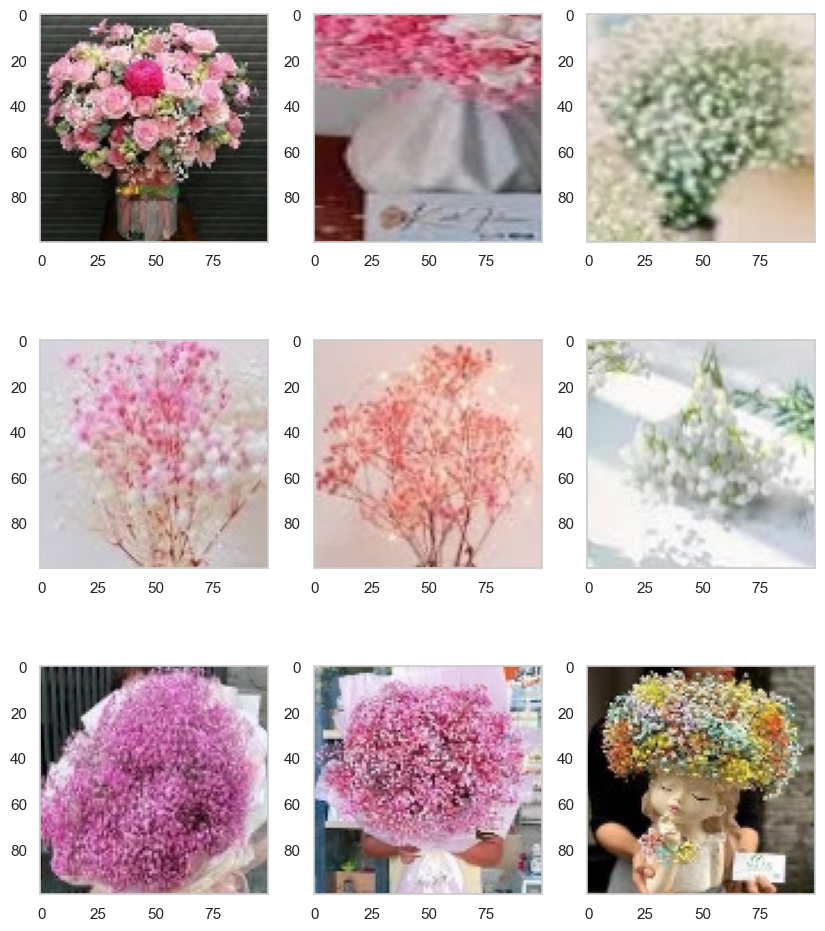

In [81]:
showImageList(df['ImagePath'].head(9))

In [82]:
# Function for reading image and generate numpy array
from sklearn.preprocessing import StandardScaler

def read_img(input_df, cols = 'ImagePath') :
    # Initialize an empty list to store images
    images = []
    # Iterate through the image path column
    for image_path in input_df[cols]:
      # Open the image using PIL
      image = PIL.Image.open(image_path)
      # Convert the image to a numpy array
      image_array = np.array(image)
      # Append the image array to the list
      images.append(image_array)
      
    # Convert the list of images to a numpy array
    images = np.array(images)
    return images

In [83]:
!pip install keras-balanced-batch-generator


  Using cached keras_balanced_batch_generator-0.0.2-py3-none-any.whl (4.7 kB)





In [84]:
# '''
# Create a class for generating randomly transforming images
# '''
# class BalancedDataGenerator(Sequence):
#     """ImageDataGenerator + RandomOversampling"""
#     def __init__(self, input_df, y, datagen, batch_size=32):
#         x = np.array([np.array(PIL.Image.open(f).convert('RGB').resize((224, 224))) for f in input_df['ImagePath']])
#         # print(len(x))
#         y = y.values
#         self.datagen = datagen
#         self.batch_size = batch_size
#         self.gen, self.steps_per_epoch = balanced_batch_generator(x.reshape(x.shape[0], -1), y, sampler=RandomOverSampler(), batch_size=batch_size, keep_sparse=True)
        
#     def __len__(self):
#         return self.steps_per_epoch

#     def __getitem__(self, idx):
#         x_batch, y_batch = self.gen.__next__()
#         x_batch = x_batch.reshape((-1, 224, 224, 3-1)) # Reshape to 4D tensor
#         x_batch = self.datagen.flow(x_batch, batch_size=self.batch_size, shuffle=False).next()
#         return x_batch, y_batch

# # Load the images into a NumPy array

# # Normalize the image data
datagen = ImageDataGenerator(
                rotation_range=20,
                width_shift_range=0.1,
                height_shift_range=0.1,
                shear_range=0.2,
                zoom_range=0.2,
                horizontal_flip=True,
                vertical_flip=True,
                fill_mode='nearest',
                brightness_range=(0.5,1),
                rescale=1./255)

# # Create the balanced data generator
# # balanced_gen = BalancedDataGenerator(x, df['Class'].values, datagen, batch_size=64)

In [85]:
# balanced_gen = BalancedDataGenerator(X_train, y_train, datagen, batch_size=64)

In [86]:
# balanced_gen = BalancedDataGenerator(x, df['Class'].values, datagen, batch_size=64)

In [87]:
# num_samples = len(balanced_gen) * balanced_gen.batch_size
# print("Number of samples:", num_samples)

In [88]:
# # Generate a batch of data
# x_batch, y_batch = balanced_gen.__getitem__(0)

# # Plot the images in the batch
# fig, axs = plt.subplots(nrows=8, ncols=8, figsize=(10, 10))
# for i in range(8):
#     for j in range(8):
#         axs[i, j].imshow(x_batch[i * 8 + j])
#         axs[i, j].axis('off')
#         axs[i, j].set_title(y_batch[i * 8 + j])
# plt.tight_layout()
# plt.show()

In [89]:
# # Get the number of batches
# num_batches = len(balanced_gen)

# # Create a dictionary to store the count of each label
# label_count = {}

# # Loop through each batch and count the labels
# for i in range(num_batches):
#     # Get a batch of data and labels
#     x_batch, y_batch = balanced_gen[i]
    
#     # Get the unique labels in the batch
#     unique_labels, label_counts = np.unique(y_batch, return_counts=True)
    
#     # Add the label counts to the label_count dictionary
#     for label, count in zip(unique_labels, label_counts):
#         if label in label_count:
#             label_count[label] += count
#         else:
#             label_count[label] = count

# # Print the label count dictionary
# print(label_count)

In [90]:
# # Create a bar chart of the label counts
# labels = list(label_count.keys())
# counts = list(label_count.values())
# fig = plt.figure(figsize=(12,7))
# plt.bar(labels, counts, width=.5)

# # Add labels to the chart
# plt.title('Data amount after augmentation')
# plt.xlabel('Class')
# plt.ylabel('Count')
# plt.yticks([0,200,400,600,800,1000,1100,1200])

# # Show the chart
# plt.show()

It can be seen that all the classes have the nearly equal amount of data.

<a id='3.5'></a>
### **3.5.** Dataset split
***

After cleansing the data, the next step is to split them into train, test and validation sets which respect to the ratio 60-20-20.

In [91]:
train_data, test_data = train_test_split(df, test_size=.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=.25, random_state=42)

print("Train data : {}, Validation Data: {}, Test Data: {}".format(train_data.shape[0], val_data.shape[0], test_data.shape[0]))

Train data : 3099, Validation Data: 1034, Test Data: 1034


In [92]:
train_datagen = ImageDataGenerator(rescale=1./255, data_format='channels_last')
val_datagen = ImageDataGenerator(rescale=1./255, data_format='channels_last')

In [93]:
# batch_size = 64
# target_size = (100,100)

# train_batch = train_datagen.flow_from_dataframe(
#         dataframe=train_data,
#         directory='',
#         x_col="ImagePath",
#         y_col="Class",
#         target_size=target_size,
#         batch_size=batch_size,
#         class_mode='categorical')

# val_batch = val_datagen.flow_from_dataframe(
#         dataframe=val_data,
#         directory='',
#         x_col="ImagePath",
#         y_col="Class",
#         target_size=target_size,
#         batch_size=batch_size,
#         class_mode='categorical')

In [94]:
# Handle unblanced dataset for train set
from imblearn.over_sampling import SMOTE

def handle_imbalanced(X_input, y_input, res_class = 'Class'):
  smote = SMOTE()
  X_input  = read_img(train_data.drop(res_class,axis=1))
  num_samples, height, width, num_channels = X_input.shape
  # Convert array to 2d arrays
  X_input = X_input.reshape(num_samples, height*width*num_channels)
  # Perform OHE
  y_input = pd.get_dummies(train_data[res_class]).values
  X_input, y_input = smote.fit_resample(X_input,y_input)
  # Reshape array back to original state
  X_input = X_input.reshape(-1, height, width, num_channels)
  return X_input, y_input

In [95]:
X_train  = read_img(train_data.drop('Class',axis=1))
y_train = pd.get_dummies(train_data['Class']).values

In [96]:
X_train, y_train = handle_imbalanced(X_train, y_train)

In [125]:
X_val = read_img(val_data.drop('Class', axis=1))
y_val = pd.get_dummies(val_data['Class']).values

In [97]:
X_test  = read_img(test_data.drop('Class',axis=1))
y_test = pd.get_dummies(test_data['Class']).values

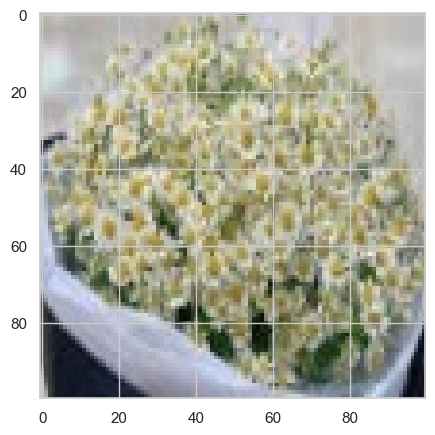

array([0, 0, 0, 0, 0, 0, 0, 1])

In [98]:
# Assuming you have a numpy array named 'img'
plt.imshow(X_train[50])
plt.show()
y_train[5000]

In [99]:
X_test.shape

(1034, 100, 100, 3)

In [100]:
y_test.shape

(1034, 8)

<a id='IV'></a>
<h2 style='color:#4472C4;font-size:45px;font-family:helvetica;text-align:center;'>
    <strong>
    IV. Model Building
    </strong>
</h2>

## 1. Classifier

VGG-16

In [101]:
from seaborn.rcmod import reset_orig
from keras import backend as K

def recall(y_true, y_pred):
    tp = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_p = K.sum(K.round(K.clip(y_true, 0, 1)))
    reset_orig = tp / (possible_p + K.epsilon())
    return reset_orig


def precision(y_true, y_pred):
    tp = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    pred_p = K.sum(K.round(K.clip(y_pred, 0, 1)))
    preci = tp / (pred_p + K.epsilon())
    return preci


def f1(y_true, y_pred):
    preci = precision(y_true, y_pred)
    rec = recall(y_true, y_pred)
    return 2 * ((preci * rec) / (preci + rec + K.epsilon()))


In [102]:

# Define the input shape
input_shape = (100,100,3)

# Define the number of output classes
num_classes = 8

def vgg16(input_shape=(100, 100, 3), num_classes=8):
    model = tf.keras.Sequential()

    # Convolutional layers
    model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu', input_shape=input_shape))
    model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Flatten and fully-connected layers
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(units=4096, activation='relu'))
    model.add(tf.keras.layers.Dense(units=4096, activation='relu'))
    model.add(tf.keras.layers.Dense(units=num_classes, activation='softmax'))

    return model
# Print a summary of the model
vgg16_model = vgg16(input_shape = input_shape)
vgg16_model.summary()

Metal device set to: Apple M1 Pro

Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 100, 100, 64)      1792      

                                                                 

 conv2d_1 (Conv2D)           (None, 100, 100, 64)      36928     

                                                                 

 max_pooling2d (MaxPooling2  (None, 50, 50, 64)        0         

 D)                                                              

                                                                 

 conv2d_2 (Conv2D)           (None, 50, 50, 128)       73856     

                                                                 

 conv2d_3 (Conv2D)           (None, 50, 50, 128)       147584    

                                                                 

 max_pooling2d_1 (MaxPoolin  (None, 25, 25, 128)       0         

 g2D)

In [103]:
from keras.optimizers import Adam

opt = Adam(learning_rate=0.00006, beta_1=0.9, beta_2=0.999, epsilon=None, amsgrad=False)
# Compile the model
vgg16_model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy',recall, precision, f1])

In [104]:
def Train_CNN_Model(epochs_num, model, train_iter, valid_iter, export_dir="./export", name="default"):
    # -------------------------------------------------------------------------
    #                        Train CNN Model
    # -------------------------------------------------------------------------

    epochs = epochs_num

    callbacks = [EarlyStopping(patience=5, restore_best_weights=True)]

    history = model.fit(
        train_iter,
        validation_data=valid_iter,
        epochs=epochs,
        verbose=1,
        callbacks=callbacks,
    )

    return history

In [105]:
BATCH_SIZE = 64
train_batch = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
val_batch = train_datagen.flow(X_test, y_test, batch_size=BATCH_SIZE)

# --Testing--
# train_batch = datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
# val_batch = datagen.flow(X_test, y_test, batch_size=BATCH_SIZE)

In [106]:
# from keras_balanced_batch_generator import make_generator
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(patience=20)

In [107]:
def eval_metric(model, history, metric_name):
    '''
    Function to evaluate a trained model on a chosen metric. 
    Training and validation metric are plotted in a
    line chart for each epoch.
    
    Parameters:
        history : model training history
        metric_name : loss or accuracy
    Output:
        line chart with epochs of x-axis and metric on
        y-axis
    '''
    metric = history.history[metric_name]
    val_metric = history.history['val_' + metric_name]
    e = range(1, NB_START_EPOCHS + 1)
    plt.plot(e, metric, 'bo', label='Train ' + metric_name)
    plt.plot(e, val_metric, 'b', label='Validation ' + metric_name)
    plt.xlabel('Epoch number')
    plt.ylabel(metric_name)
    plt.title('Comparing training and validation ' + metric_name + ' for ' + model.name)
    plt.legend()
    plt.show()

In [108]:
tf.debugging.set_log_device_placement(True)
history = vgg16_model.fit(train_batch, validation_data = val_batch, epochs=100, callbacks=[early_stopping])

Epoch 1/100

81/81 [==============================] - 41s 491ms/step - loss: 2.0404 - accuracy: 0.1667 - recall: 9.6451e-04 - precision: 0.0412 - f1: 0.0018 - val_loss: 1.9269 - val_accuracy: 0.2505 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00 - val_f1: 0.0000e+00

Epoch 2/100

81/81 [==============================] - 39s 487ms/step - loss: 1.9413 - accuracy: 0.2244 - recall: 0.0023 - precision: 0.0658 - f1: 0.0044 - val_loss: 1.9237 - val_accuracy: 0.3027 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00 - val_f1: 0.0000e+00

Epoch 3/100

64/81 [======================>.......] - ETA: 7s - loss: 1.8898 - accuracy: 0.2554 - recall: 0.0056 - precision: 0.1276 - f1: 0.0105

KeyboardInterrupt: 

In [109]:
filename = 'vgg16.h5'
pickle.dump(vgg16_model, open(filename, 'wb'))

In [110]:
def plot_history(history):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title("Model accuracy and loss")
    plt.ylabel("Accuracy/Loss")
    plt.xlabel("Epoch")
    plt.legend(["Accuracy","Validation Accuracy","Loss","Validation Loss"])
    plt.show()

In [111]:
plot_history(history)

NameError: name 'history' is not defined

In [126]:
from sklearn.metrics import classification_report

# Make predictions on the test set
y_pred = vgg16_model.predict(X_val)
y_pred = (y_pred > 0.5) 
# y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_val, y_pred))

33/33 [==============================] - 3s 72ms/step

              precision    recall  f1-score   support



           0       0.00      0.00      0.00       234

           1       0.08      1.00      0.15        81

           2       0.00      0.00      0.00       180

           3       0.00      0.00      0.00       109

           4       0.00      0.00      0.00       211

           5       0.00      0.00      0.00        70

           6       0.00      0.00      0.00        34

           7       0.00      0.00      0.00       115



   micro avg       0.08      0.08      0.08      1034

   macro avg       0.01      0.12      0.02      1034

weighted avg       0.01      0.08      0.01      1034

 samples avg       0.08      0.08      0.08      1034




/opt/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

  _warn_prf(average, modifier, msg_start, len(result))


### ResNet

In [114]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, AveragePooling2D, Flatten, Dense
from tensorflow.keras.models import Model

def convolutional_block(X, f, filters, stage, block, s=2):
    conv_name_base = 'conv' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1')(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = tf.keras.layers.add([X, X_shortcut])
    X = Activation('relu')(X)

    return X


def identity_block(X, f, filters, stage, block):
    conv_name_base = 'conv' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = tf.keras.layers.add([X, X_shortcut])
    X = Activation('relu')(X)

    return X


def ResNet50(input_shape=(100, 100, 3), classes=8):
    X_input = Input(input_shape)

    X = Conv2D(64, (7, 7), strides=(2, 2), padding='same', name='conv1')(X_input)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')

    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    X = AveragePooling2D((2, 2), name='avg_pool')(X)

    X = Flatten()(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes))(X)

    model = Model(inputs=X_input, outputs=X, name='resnet50')

    return model


In [115]:
from keras.optimizers import Adam
res_50 = ResNet50()
opt = Adam(learning_rate=0.00006, beta_1=0.9, beta_2=0.999, epsilon=None, amsgrad=False)
# Compile the model
res_50.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy',recall, precision, f1])

In [116]:
res_50.summary()

Model: "resnet50"

__________________________________________________________________________________________________

 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 100, 100, 3)]        0         []                            

                                                                                                  

 conv1 (Conv2D)              (None, 50, 50, 64)           9472      ['input_1[0][0]']             

                                                                                                  

 bn_conv1 (BatchNormalizati  (None, 50, 50, 64)           256       ['conv1[0][0]']               

 on)                                                                                              

                                                                                                  

 activation (Activation)     (None, 50, 50, 64)           0         ['bn_conv1[0

In [117]:
history = res_50.fit(train_batch, validation_data = val_batch, epochs=100, callbacks=[early_stopping])

Epoch 1/100

81/81 [==============================] - 31s 335ms/step - loss: 2.1875 - accuracy: 0.2014 - recall: 0.0272 - precision: 0.2328 - f1: 0.0481 - val_loss: 2.0650 - val_accuracy: 0.2340 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00 - val_f1: 0.0000e+00

Epoch 2/100

81/81 [==============================] - 23s 279ms/step - loss: 1.9158 - accuracy: 0.2791 - recall: 0.0575 - precision: 0.4627 - f1: 0.1008 - val_loss: 2.6511 - val_accuracy: 0.1383 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00 - val_f1: 0.0000e+00

Epoch 3/100

81/81 [==============================] - 24s 300ms/step - loss: 1.7721 - accuracy: 0.3415 - recall: 0.1061 - precision: 0.5655 - f1: 0.1754 - val_loss: 3.2122 - val_accuracy: 0.1673 - val_recall: 0.0129 - val_precision: 0.1482 - val_f1: 0.0235

Epoch 4/100

81/81 [==============================] - 24s 299ms/step - loss: 1.6859 - accuracy: 0.3810 - recall: 0.1368 - precision: 0.5768 - f1: 0.2180 - val_loss: 3.1077 - val_accuracy: 0.2379 - val_r

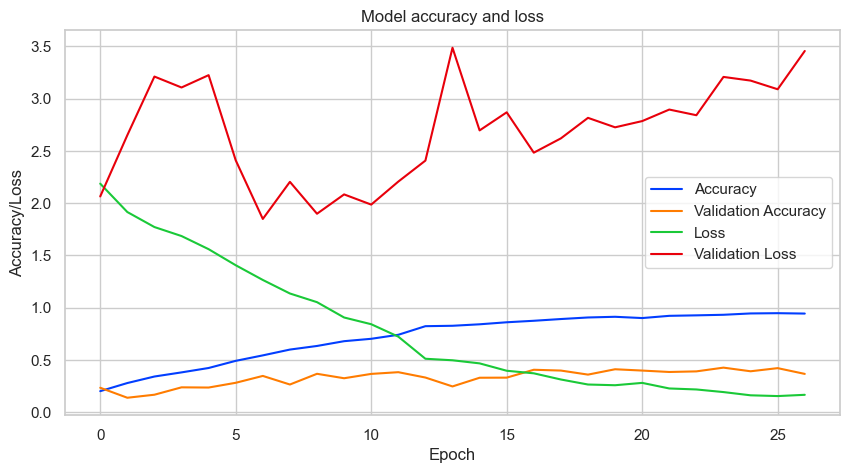

In [118]:
plot_history(history)

In [128]:
from sklearn.metrics import classification_report

# Make predictions on the test set
y_pred = res_50.predict(X_val)
y_pred = (y_pred > 0.5) 
# y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_val, y_pred))

33/33 [==============================] - 3s 52ms/step

              precision    recall  f1-score   support



           0       0.00      0.00      0.00       234

           1       0.00      0.00      0.00        81

           2       0.00      0.00      0.00       180

           3       0.11      1.00      0.19       109

           4       0.00      0.00      0.00       211

           5       0.00      0.00      0.00        70

           6       0.00      0.00      0.00        34

           7       0.00      0.00      0.00       115



   micro avg       0.11      0.11      0.11      1034

   macro avg       0.01      0.12      0.02      1034

weighted avg       0.01      0.11      0.02      1034

 samples avg       0.11      0.11      0.11      1034




/opt/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

  _warn_prf(average, modifier, msg_start, len(result))


### Catboost

In [ ]:
# %pip install catboost

In [129]:
X_train_catboost = np.array([item.ravel() for item in X_train])
X_test_catboost = np.array([item.ravel() for item in X_test])
X_val_catboost = np.array([item.ravel() for item in X_val])

In [130]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MultiLabelBinarizer
import catboost as cb

# Step 1: Prepare your image data
# Flatten the image array to shape (10000, 3)
# Convert your target variable to a 1D array of shape (10000,)

# Step 2: Define your pipeline
pipeline = Pipeline([
    ('feature_extraction', PCA(n_components=50)),  # Adjust the number of components as needed
    ('feature_selection', SelectKBest(k=10)),  # Adjust the number of features as needed
    ('scaler', StandardScaler()),
    ('catboost', cb.CatBoostClassifier()) 
])

In [131]:
y_train_catboost = np.argmax(y_train, axis = 1)
y_test_catboost = np.argmax(y_test, axis = 1)
y_val_catboost = np.argmax(y_val, axis = 1)

In [132]:
y_train_catboost.shape

(5160,)

In [133]:
pipeline.fit(X_train_catboost, y_train_catboost)

Learning rate set to 0.086034

0:	learn: 2.0611576	total: 63.1ms	remaining: 1m 3s

1:	learn: 2.0396835	total: 70.3ms	remaining: 35.1s

2:	learn: 2.0182003	total: 76ms	remaining: 25.2s

3:	learn: 2.0015083	total: 82.6ms	remaining: 20.6s

4:	learn: 1.9874392	total: 89ms	remaining: 17.7s

5:	learn: 1.9688288	total: 96ms	remaining: 15.9s

6:	learn: 1.9518351	total: 102ms	remaining: 14.5s

7:	learn: 1.9392740	total: 109ms	remaining: 13.5s

8:	learn: 1.9254198	total: 115ms	remaining: 12.7s

9:	learn: 1.9116960	total: 122ms	remaining: 12s

10:	learn: 1.8989211	total: 128ms	remaining: 11.5s

11:	learn: 1.8874435	total: 142ms	remaining: 11.7s

12:	learn: 1.8765922	total: 152ms	remaining: 11.5s

13:	learn: 1.8672348	total: 161ms	remaining: 11.4s

14:	learn: 1.8601055	total: 170ms	remaining: 11.2s

15:	learn: 1.8508324	total: 180ms	remaining: 11.1s

16:	learn: 1.8438404	total: 188ms	remaining: 10.8s

17:	learn: 1.8359665	total: 193ms	remaining: 10.5s

18:	learn: 1.8282788	total: 199ms	remaining: 

Pipeline(steps=[('feature_extraction', PCA(n_components=50)),
                ('feature_selection', SelectKBest()),
                ('scaler', StandardScaler()),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x299da1790>)])

In [134]:
from sklearn.metrics import classification_report

# Make predictions on the test set
y_pred = pipeline.predict(X_val_catboost)
# y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_val_catboost, y_pred))

              precision    recall  f1-score   support



           0       0.52      0.50      0.51       234

           1       0.26      0.30      0.28        81

           2       0.44      0.37      0.40       180

           3       0.33      0.33      0.33       109

           4       0.38      0.32      0.35       211

           5       0.15      0.13      0.14        70

           6       0.17      0.29      0.22        34

           7       0.44      0.62      0.52       115



    accuracy                           0.39      1034

   macro avg       0.34      0.36      0.34      1034

weighted avg       0.39      0.39      0.39      1034




In [135]:
X_train_catboost.shape

(5160, 30000)

In [136]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
param_grid = {
    'feature_extraction__n_components': sp_randint(10, X_train_catboost.shape[1]),
    'feature_selection__k': sp_randint(0,10),  # Adjust the number of features as needed
    'catboost__iterations': sp_randint(100, 1000),
    'catboost__learning_rate': [0.01, 0.1, 0.5,0.00001, 0.001],
    'catboost__depth': sp_randint(3, 10)
    # Add more parameters to tune as needed
}

In [137]:
random_search = RandomizedSearchCV(pipeline, param_distributions=param_grid, n_iter=100, cv=5, random_state=42)

In [138]:
random_search.fit(X_train_catboost,y_train_catboost)

0:	learn: 2.0791941	total: 17.3ms	remaining: 13.1s

1:	learn: 2.0789707	total: 21ms	remaining: 7.98s

2:	learn: 2.0787507	total: 26.4ms	remaining: 6.68s

3:	learn: 2.0785180	total: 69.7ms	remaining: 13.2s

4:	learn: 2.0782851	total: 84ms	remaining: 12.7s

5:	learn: 2.0780275	total: 100ms	remaining: 12.6s

6:	learn: 2.0777888	total: 115ms	remaining: 12.4s

7:	learn: 2.0775454	total: 151ms	remaining: 14.2s

8:	learn: 2.0773145	total: 163ms	remaining: 13.7s

9:	learn: 2.0771180	total: 167ms	remaining: 12.6s

10:	learn: 2.0768834	total: 172ms	remaining: 11.7s

11:	learn: 2.0766316	total: 175ms	remaining: 11s

12:	learn: 2.0763877	total: 182ms	remaining: 10.5s

13:	learn: 2.0762233	total: 185ms	remaining: 9.85s

14:	learn: 2.0759917	total: 189ms	remaining: 9.39s

15:	learn: 2.0757714	total: 192ms	remaining: 8.92s

16:	learn: 2.0755191	total: 195ms	remaining: 8.53s

17:	learn: 2.0753288	total: 200ms	remaining: 8.25s

18:	learn: 2.0750656	total: 203ms	remaining: 7.94s

19:	learn: 2.0748104	to

KeyboardInterrupt: 

In [139]:
best_params = random_search.best_params_
best_model = random_search.best_estimator_

AttributeError: 'RandomizedSearchCV' object has no attribute 'best_params_'

In [140]:
best_params

NameError: name 'best_params' is not defined

In [141]:
from sklearn.metrics import classification_report

# Make predictions on the test set
y_pred = best_model.predict(X_val_catboost)
# y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_val_catboost, y_pred))

NameError: name 'best_model' is not defined

In [142]:
# Make predictions on the test set
y_pred = best_model.predict(X_test_catboost)
# y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test_catboost, y_pred))

NameError: name 'best_model' is not defined

## 2. Recommender

### Cosine similarity (model-based approach)

In [ ]:
def vgg16_CutOff(input_shape=(100, 100, 3), num_classes=8):
    model = tf.keras.Sequential()

    # Convolutional layers
    model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu', input_shape=input_shape))
    model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Flatten and fully-connected layers
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(units=4096, activation='relu'))
    model.add(tf.keras.layers.Dense(units=4096, activation='relu'))
    
    return model

In [ ]:
feat_extractor = vgg16_CutOff()

In [ ]:
feat_extractor.summary()

In [ ]:
plt.imshow(X_train[100])

In [ ]:
# load all the images and prepare them for feeding into the CNN
importedImages = []

for fileTrain in train_data['ImagePath']:
    original = load_img(fileTrain, target_size=RESIZED_DIMENSION)
    numpy_image = img_to_array(original)
    image_batch = np.expand_dims(numpy_image, axis=0)
    importedImages.append(image_batch)
    
images = np.vstack(importedImages)

processed_imgs = preprocess_input(images.copy())

In [ ]:
imgs_features = feat_extractor.predict(processed_imgs)

print("features successfully extracted!")
imgs_features.shape

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
# compute cosine similarities between images
cosSimilarities = cosine_similarity(imgs_features)

In [ ]:
# store the results into a pandas dataframe
cos_similarities_df = pd.DataFrame(cosSimilarities, columns=train_data['ImagePath'], index=train_data['ImagePath'])
cos_similarities_df.head()

In [ ]:
nb_closest_images = 10

In [ ]:
def retrieve_most_similar_products(given_img):

    print("-----------------------------------------------------------------------")
    print("original product:")

    original = load_img(given_img, target_size=RESIZED_DIMENSION)
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("most similar products:")

    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]
        

    for i in range(1,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(225,225))
        plt.figure(figsize=(20,20))
        plt.subplot(4,3,i)
        plt.xlabel(str(f'Similarity score: {closest_imgs_scores[i]}'))
        plt.imshow(original)
        plt.show()


In [ ]:
print(train_data.iloc[1]['ImagePath'])

In [ ]:
retrieve_most_similar_products(train_data.iloc[10]['ImagePath'])

### Cosine Similarity (no model-based)

In [253]:
"""
Show images in a custom grid based on given list
"""
def showCustomImageList(imageList):
    plt.figure(figsize=(10,18))
    i = 0 # N.o in subplot display

    for imgPath, imgSimScore in imageList.items():
        imageName = imgPath.split('/')[-1]
        imageClass = imgPath.split('/')[-2]
        imageLabel = imageName + ' - ' + str(int(round(imgSimScore, 2) * 100)) + "%"

        img = plt.imread(imgPath)
        plt.subplot(4,3,i+1)
        ax = plt.gca()
        ax.set_title(imageClass)
        ax.set_xlabel(imageLabel, fontsize=12)
        plt.grid(visible= False)
        plt.imshow(img)
        i += 1

In [249]:
def extract_features(image_path):
    img = PIL.Image.open(image_path)
    # img = img.resize((224, 224))  # Resize the image to a common size for feature extraction
    return np.array(img).ravel()

def content_based_recommendation(query_image_path, train_data_path):
    # Extract features from the query image
    query_features = extract_features(query_image_path)
    
    # Initialize a dictionary to store cosine similarity scores
    similarity_scores = {}
    
    # Iterate over the subfolders in the train data directory
    for folder_name in os.listdir(train_data_path):
        folder_path = os.path.join(train_data_path, folder_name)
        if not os.path.isdir(folder_path):
            continue
        
        # Iterate over the image files in each subfolder
        for filename in os.listdir(folder_path):
            image_path = os.path.join(folder_path, filename)
            
            # Extract features from the train image
            train_features = extract_features(image_path)
            
            # Calculate the cosine similarity between query and train features
            similarity = cosine_similarity([query_features], [train_features])[0][0]
            
            # Store the similarity score for the current train image
            similarity_scores[image_path] = similarity
    
    # Sort the similarity scores in descending order
    sorted_scores = sorted(similarity_scores.items(), key=lambda x: x[1], reverse=True)
    topTenSimilar = {}

    print(f"Your input image: {query_image_path}")
    inputImg = plt.imread(query_image_path)
    plt.imshow(inputImg)

    # Display the top 10 recommended images, ignore the first image
    # as it is the same input image.
    for i in range(1,11):
        image_path, similarity = sorted_scores[i]
        topTenSimilar.update({image_path: similarity})
        print(f"Recommended Image {i}: {image_path} (Similarity Score: {similarity})")

    showCustomImageList(topTenSimilar)

In [245]:
def loadUI(name = ""):
    print("========================")
    print("Welcome to Flower Shop")
    print("========================")

    uploadedImage = input("PLEASE UPLOAD THE IMAGE")
    imgClass = uploadedImage.split('_')[0].capitalize()
    query_image_path = f"./data/cleansed_data/{imgClass}/{uploadedImage}.jpg"
    return query_image_path


Welcome to Flower Shop


Your input image: ./data/cleansed_data/Tana/tana_2.jpg

Recommended Image 1: ./data/cleansed_data/Hydrangeas/hydrangeas_94.jpg (Similarity Score: 0.9607868649107231)

Recommended Image 2: ./data/cleansed_data/Tana/tana_261.jpg (Similarity Score: 0.9602877554385332)

Recommended Image 3: ./data/cleansed_data/Babi/babi_587.7.jpg (Similarity Score: 0.959869559826627)

Recommended Image 4: ./data/cleansed_data/Calimerio/calimero_254.8.jpg (Similarity Score: 0.959646633408171)

Recommended Image 5: ./data/cleansed_data/Babi/babi_587.jpg (Similarity Score: 0.9596240715038669)

Recommended Image 6: ./data/cleansed_data/Tana/tana_393.jpg (Similarity Score: 0.9591209876242606)

Recommended Image 7: ./data/cleansed_data/Tana/tana_492.jpg (Similarity Score: 0.9589599434621772)

Recommended Image 8: ./data/cleansed_data/Tana/tana_495.jpg (Similarity Score: 0.9589599434621772)

Recommended Image 9: ./data/cleansed_data/Babi/babi_173.jpg (Similarity Score: 0.958890850160979

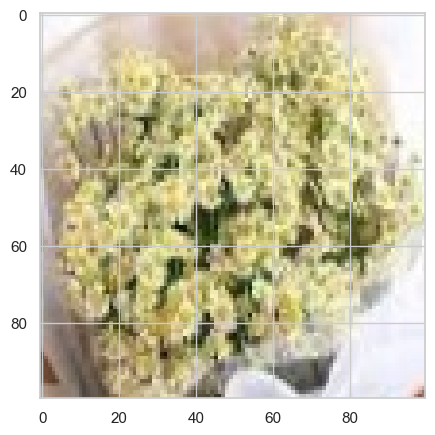

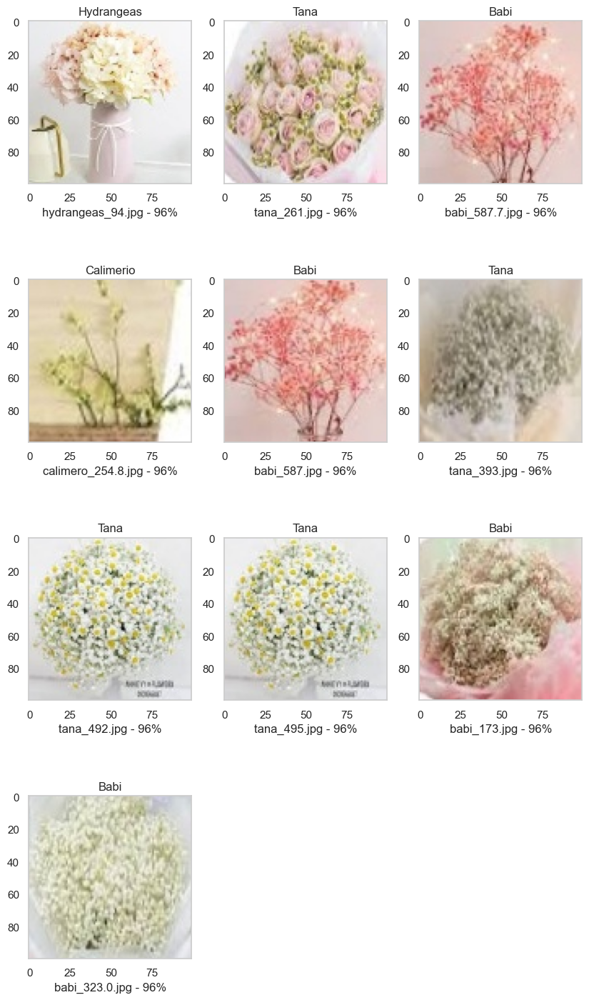

In [266]:
# --Testing--
input_image = loadUI()
content_based_recommendation(input_image, train_data_path = "./data/cleansed_data/")

<a id='V'></a>
<h2 style='color:#4472C4;font-size:45px;font-family:helvetica;text-align:center;'>
    <strong>
    V. Final Verdict
    </strong>
</h2>

<a id='VI'></a>
<h2 style='color:#4472C4;font-size:45px;font-family:helvetica;text-align:center;'>
    <strong>
    VI. References
    </strong>
</h2>